<a href="https://colab.research.google.com/github/jmadao/POS_DSA_PUC_RJ/blob/main/SPRINT_II_MVP_JOAO_ADAO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SPRINT II - MVP - João Marco Adão Ananias

##1ª Parte - Machine Learning

### Definição do Problema



###### Uma empresa de telecom possui uma rotatividade muito alta de seus clientes, ou seja, muitos clientes antigos migram para uma concorrente;


##### Com este problema a ser resolvido, a área de negócios decidiu contratar uma consultoria especializada em ciência de dados, para conseguir prever a partir desta base de clientes, quais clientes serão perdidos;


##### Essa informação ajudará a empresa tomar ações estratégicas, sabendo exatamente para quais clientes oferecer alguns tipos de benefícios personalizados como aumento do pacote de download e upload, pacote de televisão, pacote de filmes, um contrato de retenção, dando desconto na mensalidade etc;


##### Como iremos determinar se o cliente irá virar Churn ou não, ou seja, descobrir a qual classe esse cliente vai pertencer, temos um problema de CLASSIFICAÇÃO;


##### Então, a partir daqui, estará exposto a resolução do problema aplicado pela consultoria.

###Importação de Bibliotecas

In [ ]:
## Configuração para não exibir os warnings

import warnings
warnings.filterwarnings("ignore")

## Imports necessários para análises

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Imports necesssários para criação de modelo de Classificação

from sklearn.ensemble import ExtraTreesClassifier # ExtraTrees, para a Importância de Atributos
from sklearn.feature_selection import SelectKBest # para a Seleção Univariada
from sklearn.feature_selection import f_classif # para o teste ANOVA da Seleção Univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de Atributos
from sklearn.linear_model import LogisticRegression # Regressão Logística, para a Eliminação Recursiva de Atributos

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV


###Importação de DataSet e Transformação em DataFrame

Carregando o dataset e transformando em um dataframe

In [ ]:
dfclientes = pd.read_csv('https://raw.githubusercontent.com/jmadao/POS_DSA_PUC_RJ/main/internet_service_churn.csv')
pd.options.display.float_format = '{:.2f}'.format

## Apresentando DataFrame

dfclientes

,id,is_tv_subscriber,is_movie_package_subscriber,subscription_age,bill_avg,reamining_contract,service_failure_count,download_avg,upload_avg,download_over_limit,churn
0,15,1,0,11.95,25,0.14,0,8.40,2.30,0,0
1,18,0,0,8.22,0,NaN,0,0.00,0.00,0,1
2,23,1,0,8.91,16,0.00,0,13.70,0.90,0,1
3,27,0,0,6.87,21,NaN,1,0.00,0.00,0,1
4,34,0,0,6.39,0,NaN,0,0.00,0.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...
72269,1689648,1,1,0.09,0,1.25,0,0.00,0.00,0,1
72270,1689676,1,0,0.06,1,1.63,0,0.80,0.00,0,1
72271,1689679,1,0,0.02,0,2.19,0,1.50,0.20,0,1
72272,1689733,0,0,0.01,0,0.72,0,0.00,0.00,0,1


Renomeando colunas e explicando os campos

In [ ]:


dfclientes = dfclientes.rename(columns={'is_tv_subscriber': 'Possui_Assinatura_TV',             # Se o cliente possui um pacote de TV
                                        'is_movie_package_subscriber': 'Possui_Pacote_Filme',   # Se o cliente possui um pacote de filmes
                                        'subscription_age': 'Tempo_Assinatura',                 # Quanto tempo o cliente está na base
                                        'bill_avg': 'Fatura_Media',                             # Fatura média do cliente nos últimos 3 meses
                                        'reamining_contract': 'Tempo_Restante_Contrato',        # Quanto tempo resta de contrato pro cliente
                                        'service_failure_count': 'Total_Falhas',                # Quantas ligações para o SAC, o cliente fez
                                        'download_avg': 'Media_Download',                       # Qual é a média de download do cliente
                                        'upload_avg': 'Media_Upload',                           # Qual é a média de upload do cliente
                                        'download_over_limit': 'Limite_Download'})              # Qual é o limite de download do cliente

###Tratamentos Básicos e Análise Básica do DataSet

Analisando tipo dos dados

In [ ]:
dfclientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72274 entries, 0 to 72273
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       72274 non-null  int64  
 1   Possui_Assinatura_TV     72274 non-null  int64  
 2   Possui_Pacote_Filme      72274 non-null  int64  
 3   Tempo_Assinatura         72274 non-null  float64
 4   Fatura_Media             72274 non-null  int64  
 5   Tempo_Restante_Contrato  50702 non-null  float64
 6   Total_Falhas             72274 non-null  int64  
 7   Media_Download           71893 non-null  float64
 8   Media_Upload             71893 non-null  float64
 9   Limite_Download          72274 non-null  int64  
 10  churn                    72274 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 6.1 MB


Podemos notar que os campos "Tempo_Restante_Contrato", "Media_Download" e "Media_Upload" possuem campos nulos.

Como podem ser dados importantes, vamos descartá-los.

Excluindo dados nulos e coluna "id"

In [ ]:
dfclientes = dfclientes.dropna()

dfclientes = dfclientes.drop('id', axis = 1)

In [ ]:
dfclientes.head(10)

,Possui_Assinatura_TV,Possui_Pacote_Filme,Tempo_Assinatura,Fatura_Media,Tempo_Restante_Contrato,Total_Falhas,Media_Download,Media_Upload,Limite_Download,churn
0,1,0,11.95,25,0.14,0,8.40,2.30,0,0
2,1,0,8.91,16,0.00,0,13.70,0.90,0,1
5,1,1,11.94,32,1.38,0,69.40,4.00,0,0
6,0,0,8.96,18,0.00,0,21.30,2.00,0,1
10,1,1,8.44,17,0.00,0,9.90,1.10,0,1
11,1,1,11.93,10,1.28,0,10.60,0.60,0,0
14,0,0,6.97,23,0.28,0,0.00,0.00,0,1
15,1,1,11.93,18,1.80,0,1.00,0.00,0,0
16,1,0,11.93,22,0.01,1,10.60,2.40,0,0
19,1,1,11.93,65,0.21,0,116.80,12.10,0,0


Conhecendo um pouco melhor sobre os dados

In [ ]:
dfclientes.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Possui_Assinatura_TV,50375.00,0.89,0.31,0.00,1.00,1.00,1.00,1.00
Possui_Pacote_Filme,50375.00,0.40,0.49,0.00,0.00,0.00,1.00,1.00
Tempo_Assinatura,50375.00,2.31,2.10,-0.02,0.77,1.61,3.17,12.76
Fatura_Media,50375.00,18.39,10.05,0.00,13.00,18.00,22.00,386.00
Tempo_Restante_Contrato,50375.00,0.71,0.69,0.00,0.00,0.56,1.30,2.92
Total_Falhas,50375.00,0.28,0.81,0.00,0.00,0.00,0.00,18.00
Media_Download,50375.00,51.19,59.53,0.00,14.60,37.20,70.40,4415.20
Media_Upload,50375.00,4.82,10.17,0.00,1.00,2.80,5.60,453.30
Limite_Download,50375.00,0.08,0.56,0.00,0.00,0.00,0.00,7.00
churn,50375.00,0.40,0.49,0.00,0.00,0.00,1.00,1.00


Podemos notar que o Campo "Tempo_Assinatura" possui valor <= 0, o que não deveria ser possível. Vamos remover esses dados do DataFrame

Removendo clientes do "Tempo_Assinatura" <= 0    --->>> São 170 clientes

In [ ]:
dfclientes[dfclientes['Tempo_Assinatura'] <= 0].count()

dfclientes = dfclientes.drop(dfclientes[dfclientes['Tempo_Assinatura'] <= 0].index)

dfclientes.reset_index()

dfclientes.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Possui_Assinatura_TV,50205.00,0.89,0.31,0.00,1.00,1.00,1.00,1.00
Possui_Pacote_Filme,50205.00,0.40,0.49,0.00,0.00,0.00,1.00,1.00
Tempo_Assinatura,50205.00,2.32,2.10,0.01,0.78,1.62,3.18,12.76
Fatura_Media,50205.00,18.45,10.01,0.00,13.00,18.00,22.00,386.00
Tempo_Restante_Contrato,50205.00,0.71,0.69,0.00,0.00,0.57,1.30,2.92
Total_Falhas,50205.00,0.28,0.81,0.00,0.00,0.00,0.00,18.00
Media_Download,50205.00,51.36,59.55,0.00,14.80,37.40,70.60,4415.20
Media_Upload,50205.00,4.84,10.18,0.00,1.10,2.80,5.70,453.30
Limite_Download,50205.00,0.08,0.57,0.00,0.00,0.00,0.00,7.00
churn,50205.00,0.40,0.49,0.00,0.00,0.00,1.00,1.00


Analisando Quantitativo de Churn

<Axes: xlabel='churn', ylabel='count'>

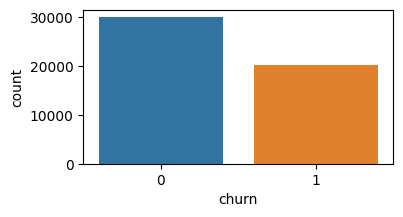

In [ ]:
plt.figure(figsize = (4,2))
sns.countplot(x = 'churn', data = dfclientes)

Podemos notar que temos uma base equilibrada, com um pouco mais de clientes que não viraram churn, do que churn.

Analisando Correlação entre Colunas

<Axes: >

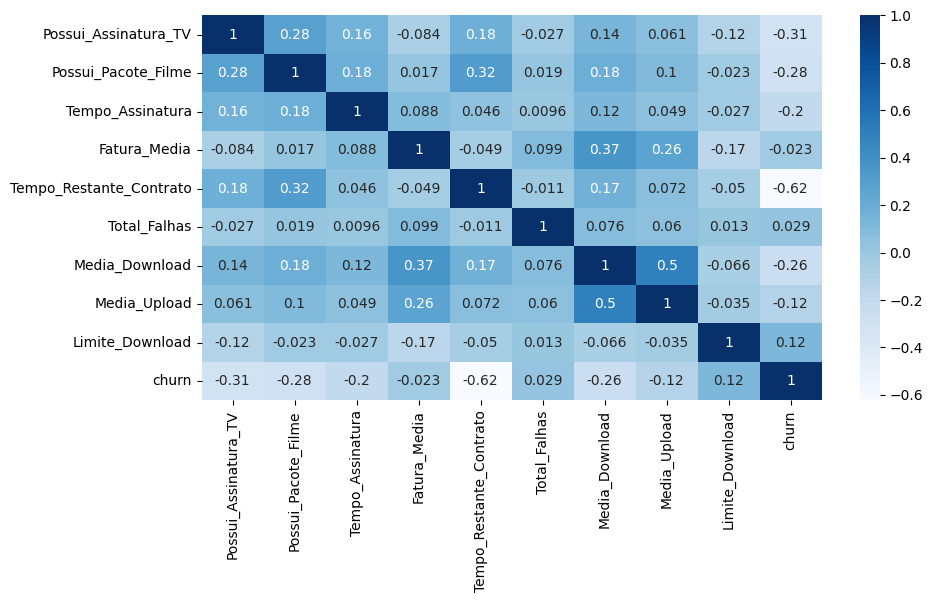

In [ ]:
plt.figure(figsize = (10,5))
sns.heatmap(dfclientes.corr(), annot = True,cmap = 'Blues')

Conseguimos notar que nenhuma coluna apresentou uma correlação forte com o target "Churn"

###Preparação dos Dados

Neste bloco, iremos separar nossa base entre treino e teste, iremos definir a métrica de avaliação do modelo e determinar os parâmetros da validação cruzada

In [ ]:
test_size = 0.20 # tamanho do conjunto de teste
seed = 10 # semente aleatória

## Separação em bases de treino e teste

array = dfclientes.values
x = array[:,0:9] # atributos
y = array[:,9] # classe

X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=test_size, shuffle=True, random_state=seed, stratify=y) # holdout com estratificação

## Parâmetros e partições da validação cruzada
scoring = 'accuracy' ## Dentre as métricas de avaliação classicas, foi decidido utilizar a Acurária.
num_particoes = 10
kfold = StratifiedKFold(n_splits=num_particoes, shuffle=True, random_state=seed) # validação cruzada com estratificação

## Vamos utilizar a validação cruzada para medir o desempenho do modelo, para utilizar todo o conjunto de treio para treinamento e avaliação.


### Avaliação dos Modelos Básicos

Aqui iremos testar os modelos clássicos de classificação, aplicando a validação cruzada para avaliação do modelo

LR: 0.866398 (0.005615)
KNN: 0.816627 (0.006819)
CART: 0.925132 (0.004857)
NB: 0.809008 (0.004529)


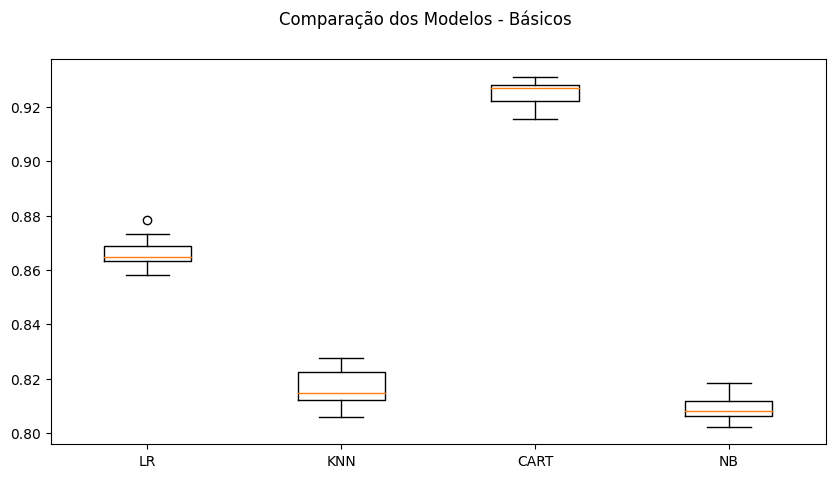

In [ ]:
np.random.seed(seed) # definindo uma semente global

## Lista que armazenará os modelos básicos
models_basico = []

## Criando os modelos e adicionando-os na lista de modelos
LR = LogisticRegression(max_iter=200) ## Regressão Logística
KNN = KNeighborsClassifier()          ## K-Nearest Neighbours
CART = DecisionTreeClassifier()       ## Árvore de Decisão
NB = GaussianNB()                     ## Naive Bayes
##SVM = SVC()                         ## Support Vector Machine -> Teve um alto custo de processamento e não teve melhor resultado... não vamos testar mais ele ao longo do projeto

models_basico.append(('LR', LR))
models_basico.append(('KNN', KNN))
models_basico.append(('CART', CART))
models_basico.append(('NB', NB))
##models_basico.append(('SVM', SVM))

## Listas para armazenar os resultados básicos
results_basico = []
names_basico = []

## Avaliação dos modelos
for name, model in models_basico:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results_basico.append(cv_results)
    names_basico.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

## Boxplot de comparação dos modelos pela acurácia
fig = plt.figure(figsize=(10,5))
fig.suptitle('Comparação dos Modelos - Básicos')
ax = fig.add_subplot(111)
plt.boxplot(results_basico)
ax.set_xticklabels(names_basico)
plt.show()

### Avaliação dos Modelos Ensenbles

Criaremos Ensenbles clássicos agora, priorizando os modelos derivados da Árvore de Decisão, que obteve uma melhor acurácia até o momento.

Bagging: 0.953067 (0.003430)
RF: 0.951001 (0.003719)
ET: 0.948063 (0.003416)
Ada: 0.944179 (0.003290)
GB: 0.947490 (0.003504)
Voting: 0.908600 (0.004261)


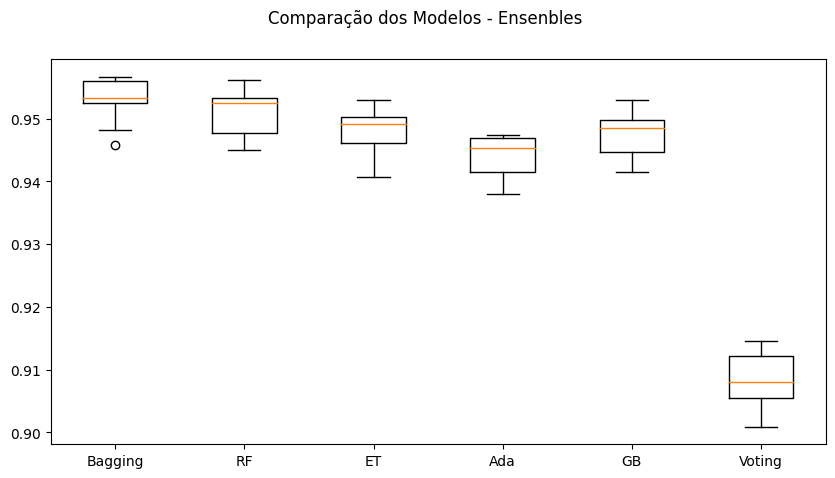

In [ ]:
## Lista que armazenará os modelos ensenbles
models_ensenble = []

# Definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3

# Criando os modelos para o VotingClassifier
bases_ensenbles = []
model1 = LogisticRegression(max_iter=200)
bases_ensenbles.append(('logistic', model1))
model2 = DecisionTreeClassifier()
bases_ensenbles.append(('cart', model2))
model3 = GaussianNB()
bases_ensenbles.append(('nb', model3))

# Criando os ensembles e adicionando-os na lista de modelos

BAG = BaggingClassifier(base_estimator=base, n_estimators=num_trees) ## Bagging
RF = RandomForestClassifier(n_estimators=num_trees, max_features=max_features) ## Random Forest
ET = ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features) ## Extra Trees
ADA = AdaBoostClassifier(n_estimators=num_trees) ## AdaBoost
GB =  GradientBoostingClassifier(n_estimators=num_trees) ## Gradiente Boosting
VOT = VotingClassifier(bases_ensenbles) ## Voting (Regressão Logística + Árvore de Decisão + Naive Bayes)


models_ensenble.append(('Bagging', BAG))
models_ensenble.append(('RF', RF))
models_ensenble.append(('ET', ET))
models_ensenble.append(('Ada', ADA))
models_ensenble.append(('GB', GB))
models_ensenble.append(('Voting', VOT))

## Listas para armazenar os resultados ensenbles
results_ensenble = []
names_ensenble = []

## Avaliação dos modelos
for name, model in models_ensenble:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results_ensenble.append(cv_results)
    names_ensenble.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

## Boxplot de comparação dos modelos
fig = plt.figure(figsize=(10,5))
fig.suptitle('Comparação dos Modelos - Ensenbles')
ax = fig.add_subplot(111)
plt.boxplot(results_ensenble)
ax.set_xticklabels(names_ensenble)
plt.show()

### Avaliação de Modelos Padronizados e Normalizados + Pipelines

Aqui, iremos criar os modelos normalizados e padronizados, para tentar melhorar ainda mais o modelo (mesmo sabendo que tendem a ter maior impacto em algorítimos de regressão ou baseados em distância, como KNN e SVM). Incluiremos também nossos modelos em Pipelines, para evitar que ocorra o Data Leakage (Vazamento de Dados).

LR-orig: 0.866 (0.006)
KNN-orig: 0.817 (0.007)
CART-orig: 0.925 (0.005)
NB-orig: 0.809 (0.005)
BAG-orig: 0.953 (0.004)
RF-orig: 0.951 (0.004)
ET-orig: 0.949 (0.003)
ADA-orig: 0.944 (0.003)
GB-orig: 0.947 (0.004)
LR-padr: 0.866 (0.006)
KNN-padr: 0.906 (0.005)
CART-padr: 0.925 (0.004)
NB-padr: 0.809 (0.005)
BAG-padr: 0.953 (0.003)
RF-padr: 0.952 (0.004)
ET-padr: 0.948 (0.004)
ADA-padr: 0.944 (0.003)
GB-padr: 0.947 (0.004)
LR-norm: 0.867 (0.006)
KNN-norm: 0.927 (0.004)
CART-norm: 0.925 (0.005)
NB-norm: 0.809 (0.005)
BAG-norm: 0.953 (0.004)
RF-norm: 0.951 (0.004)
ET-norm: 0.948 (0.003)
ADA-norm: 0.944 (0.003)
GB-norm: 0.947 (0.004)


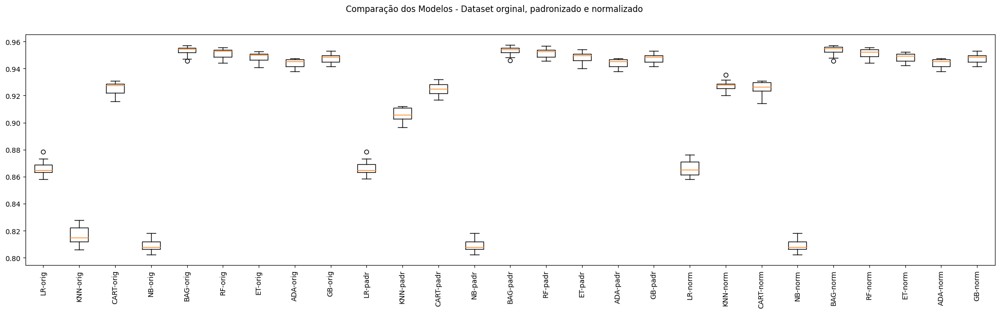

In [ ]:
# Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
pipelines = []
results_full = []
names_full = []

## Criando os modelos e adicionando-os na lista de modelos
LR = ('LR', LogisticRegression(max_iter=200))
KNN = ('KNN', KNeighborsClassifier())
CART = ('CART', DecisionTreeClassifier())
NB = ('NB', GaussianNB())
BAG = ('BAG', BaggingClassifier(base_estimator=base, n_estimators=num_trees))
RF = ('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))
ET = ('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))
ADA = ('ADA', AdaBoostClassifier(n_estimators=num_trees))
GB =  ('GB', GradientBoostingClassifier(n_estimators=num_trees))


# Transformações que serão utilizadas
standard_scaler = ('StandardScaler', StandardScaler()) # Padronização
min_max_scaler = ('MinMaxScaler', MinMaxScaler())      # Normalização


# Montando os pipelines

# Dataset original
pipelines.append(('LR-orig', Pipeline([LR])))
pipelines.append(('KNN-orig', Pipeline([KNN])))
pipelines.append(('CART-orig', Pipeline([CART])))
pipelines.append(('NB-orig', Pipeline([NB])))
pipelines.append(('BAG-orig', Pipeline([BAG])))
pipelines.append(('RF-orig', Pipeline([RF])))
pipelines.append(('ET-orig', Pipeline([ET])))
pipelines.append(('ADA-orig', Pipeline([ADA])))
pipelines.append(('GB-orig', Pipeline([GB])))

# Dataset Padronizado
pipelines.append(('LR-padr', Pipeline([standard_scaler, LR])))
pipelines.append(('KNN-padr', Pipeline([standard_scaler, KNN])))
pipelines.append(('CART-padr', Pipeline([standard_scaler, CART])))
pipelines.append(('NB-padr', Pipeline([standard_scaler, NB])))
pipelines.append(('BAG-padr', Pipeline([standard_scaler, BAG])))
pipelines.append(('RF-padr', Pipeline([standard_scaler, RF])))
pipelines.append(('ET-padr', Pipeline([standard_scaler, ET])))
pipelines.append(('ADA-padr', Pipeline([standard_scaler, ADA])))
pipelines.append(('GB-padr', Pipeline([standard_scaler, GB])))

# Dataset Normalizado
pipelines.append(('LR-norm', Pipeline([min_max_scaler, LR])))
pipelines.append(('KNN-norm', Pipeline([min_max_scaler, KNN])))
pipelines.append(('CART-norm', Pipeline([min_max_scaler, CART])))
pipelines.append(('NB-norm', Pipeline([min_max_scaler, NB])))
pipelines.append(('BAG-norm', Pipeline([min_max_scaler, BAG])))
pipelines.append(('RF-norm', Pipeline([min_max_scaler, RF])))
pipelines.append(('ET-norm', Pipeline([min_max_scaler, ET])))
pipelines.append(('ADA-norm', Pipeline([min_max_scaler, ADA])))
pipelines.append(('GB-norm', Pipeline([min_max_scaler, GB])))

# Executando os pipelines
for name, model in pipelines:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results_full.append(cv_results)
    names_full.append(name)
    msg = "%s: %.3f (%.3f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
    print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado')
ax = fig.add_subplot(111)
plt.boxplot(results_full)
ax.set_xticklabels(names_full, rotation=90)
plt.show()

### Feature Selection

Realizaremos agora a etapa de Feature Selection em nosso modelo, na tentativa de fazer com que o modelo aprenda apenas com os dados mais relevantes do dataset.

In [ ]:
# SelectKBest

# Seleção de atributos com SelectKBest
best_var = SelectKBest(score_func=f_classif, k=5)

# Executa a função de pontuação em (X, y) e obtém os atributos selecionados
fit = best_var.fit(x, y)

# Reduz X para os atributos selecionados
features = fit.transform(x)

# Resultados
print('\nNúmero original de atributos:', x.shape[1])
print('\nNúmero reduzido de atributos:', features.shape[1])

# Exibe os atributos orginais
print("\nAtributos Originais:", dfclientes.columns[0:8])

# Exibe as pontuações de cada atributos e os 4 escolhidas (com as pontuações mais altas)
np.set_printoptions(precision=3) # 3 casas decimais
print("\nScores dos Atributos Originais:", fit.scores_)
print("\nAtributos Selecionados:", best_var.get_feature_names_out(input_features=dfclientes.columns[0:9]))


Número original de atributos: 9

Número reduzido de atributos: 5

Atributos Originais: Index(['Possui_Assinatura_TV', 'Possui_Pacote_Filme', 'Tempo_Assinatura',
       'Fatura_Media', 'Tempo_Restante_Contrato', 'Total_Falhas',
       'Media_Download', 'Media_Upload'],
      dtype='object')

Scores dos Atributos Originais: [5.209e+03 4.345e+03 2.158e+03 2.566e+01 3.194e+04 4.359e+01 3.656e+03
 7.901e+02 6.899e+02]

Atributos Selecionados: ['Possui_Assinatura_TV' 'Possui_Pacote_Filme' 'Tempo_Assinatura'
 'Tempo_Restante_Contrato' 'Media_Download']


In [ ]:
# Eliminação Recursiva de Atributos

# Criação do modelo
modelo = LogisticRegression(max_iter=200)

# Eliminação Recursiva de Atributos
rfe = RFE(modelo, n_features_to_select=5)
fit = rfe.fit(x, y)

# Print dos resultados
print("Atributos Originais:", dfclientes.columns[0:9])

# Exibe os atributos selecionados (marcados como True em "Atributos Selecionados"
# e com valor 1 em "Ranking dos Atributos")
print("\nAtributos Selecionados: %s" % fit.support_)
print("\nRanking de atributos: %s" % fit.ranking_)
print("\nQtd de melhores Atributos: %d" % fit.n_features_)
print("\nNomes dos Atributos Selecionados: %s" % fit.get_feature_names_out(input_features=dfclientes.columns[0:9]))

Atributos Originais: Index(['Possui_Assinatura_TV', 'Possui_Pacote_Filme', 'Tempo_Assinatura',
       'Fatura_Media', 'Tempo_Restante_Contrato', 'Total_Falhas',
       'Media_Download', 'Media_Upload', 'Limite_Download'],
      dtype='object')

Atributos Selecionados: [ True  True  True False  True False False False  True]

Ranking de atributos: [1 1 1 4 1 2 3 5 1]

Qtd de melhores Atributos: 5

Nomes dos Atributos Selecionados: ['Possui_Assinatura_TV' 'Possui_Pacote_Filme' 'Tempo_Assinatura'
 'Tempo_Restante_Contrato' 'Limite_Download']


In [ ]:
# Importância de Atributos com ExtraTrees

# Criação do modelo para seleção de atributos
modelo = ExtraTreesClassifier(n_estimators=100)
modelo.fit(x,y)

# Exibe os atributos orginais
print("\nAtributos Originais:", dfclientes.columns[0:9])

# Exibe a pontuação de importância para cada atributo (quanto maior a pontuação, mais importante é o atributo).
print(modelo.feature_importances_)

Percebemos que alguns atributos aparecem nos 3 modelos de feature selection. São eles:

1 - Possui Assinatura de TV

2 - Possui Pacote de Filme

3 - Tempo de Assinatura

4 - Tempo Restante de Contrato

Vamos trabalhar com estes 4 atributos

Criando novo DataFrame, apenas com as 4 colunas escolhidas no Feature Selecition

In [ ]:
dfclientesfs = dfclientes[['Possui_Assinatura_TV','Possui_Pacote_Filme','Tempo_Assinatura','Tempo_Restante_Contrato','churn']]

### Preparação dos Dados - Com Feature Selection

Realizando a preparação dos dados, separação entre treino e teste, parâmetros de avalialção e validação cruzada, para o novo dataset, apenas com as colunas geradas pelo processo de Feature Selection.

In [ ]:
## Separação em bases de treino e teste

arrayfs = dfclientesfs.values
xfs = arrayfs[:,0:4] # atributos
yfs = arrayfs[:,4] # classe

Xfs_train, Xfs_test, yfs_train, yfs_test = train_test_split(xfs,yfs,test_size=test_size, shuffle=True, random_state=seed, stratify=yfs) # holdout com estratificação

## Parâmetros e partições da validação cruzada
scoringfs = 'accuracy'
num_particoesfs = 10
kfoldfs = StratifiedKFold(n_splits=num_particoesfs, shuffle=True, random_state=seed) # validação cruzada com estratificação


### Avaliação de Modelos Básicos, Ensenbles, Padronizados e Normalizados + Pipelines + Feature Selection

Realizamos aqui o teste dos modelos com o novo dataset, reduzido com as colunas de Feature Selection

LR-orig-fs: 0.861 (0.005)
KNN-orig-fs: 0.920 (0.006)
CART-orig-fs: 0.906 (0.006)
NB-orig-fs: 0.811 (0.004)
BAG-orig-fs: 0.920 (0.005)
RF-orig-fs: 0.921 (0.004)
ET-orig-fs: 0.916 (0.005)
ADA-orig-fs: 0.927 (0.004)
GB-orig-fs: 0.931 (0.004)
VOT-orig-fs: 0.883 (0.005)
LR-padr-fs: 0.861 (0.005)
KNN-padr-fs: 0.922 (0.006)
CART-padr-fs: 0.906 (0.005)
NB-padr-fs: 0.811 (0.004)
BAG-padr-fs: 0.920 (0.005)
RF-padr-fs: 0.921 (0.006)
ET-padr-fs: 0.916 (0.005)
ADA-padr-fs: 0.927 (0.004)
GB-padr-fs: 0.931 (0.004)
VOT-padr-fs: 0.883 (0.005)
LR-norm-fs: 0.861 (0.005)
KNN-norm-fs: 0.923 (0.006)
CART-norm-fs: 0.906 (0.006)
NB-norm-fs: 0.811 (0.004)
BAG-norm-fs: 0.920 (0.005)
RF-norm-fs: 0.922 (0.005)
ET-norm-fs: 0.916 (0.005)
ADA-norm-fs: 0.927 (0.004)
GB-norm-fs: 0.931 (0.004)
VOT-norm-fs: 0.883 (0.005)


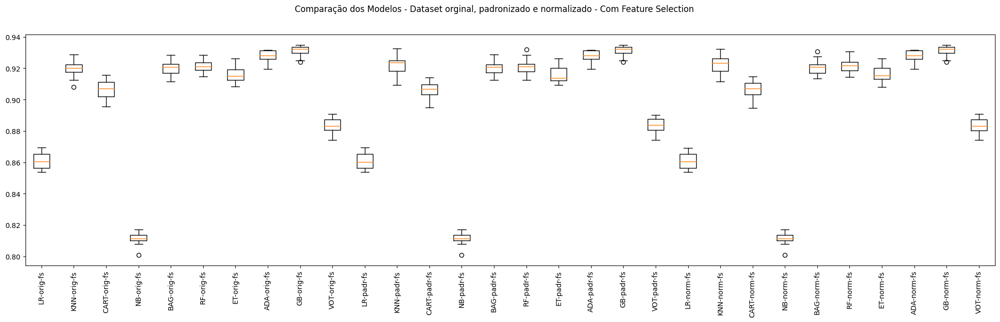

In [ ]:
# Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
pipelinesfs = []
results_fullfs = []
names_fullfs = []

## Criando os modelos e adicionando-os na lista de modelos
LRfs = ('LRfs', LogisticRegression(max_iter=200))
KNNfs = ('KNNfs', KNeighborsClassifier())
CARTfs = ('CARTfs', DecisionTreeClassifier())
NBfs = ('NBfs', GaussianNB())
BAGfs = ('BAGfs', BaggingClassifier(base_estimator=base, n_estimators=num_trees))
RFfs = ('RFfs', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))
ETfs = ('ETfs', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))
ADAfs = ('ADAfs', AdaBoostClassifier(n_estimators=num_trees))
GBfs =  ('GBfs', GradientBoostingClassifier(n_estimators=num_trees))
VOTfs = ('VOTfs', VotingClassifier(bases_ensenbles))


# Transformações que serão utilizadas
standard_scalerfs = ('StandardScalerfs', StandardScaler()) # Padronização
min_max_scalerfs = ('MinMaxScalerfs', MinMaxScaler())      # Normalização


# Montando os pipelines

# Dataset original
pipelinesfs.append(('LR-orig-fs', Pipeline([LRfs])))
pipelinesfs.append(('KNN-orig-fs', Pipeline([KNNfs])))
pipelinesfs.append(('CART-orig-fs', Pipeline([CARTfs])))
pipelinesfs.append(('NB-orig-fs', Pipeline([NBfs])))
pipelinesfs.append(('BAG-orig-fs', Pipeline([BAGfs])))
pipelinesfs.append(('RF-orig-fs', Pipeline([RFfs])))
pipelinesfs.append(('ET-orig-fs', Pipeline([ETfs])))
pipelinesfs.append(('ADA-orig-fs', Pipeline([ADAfs])))
pipelinesfs.append(('GB-orig-fs', Pipeline([GBfs])))
pipelinesfs.append(('VOT-orig-fs', Pipeline([VOTfs])))

# Dataset Padronizado
pipelinesfs.append(('LR-padr-fs', Pipeline([standard_scalerfs, LRfs])))
pipelinesfs.append(('KNN-padr-fs', Pipeline([standard_scalerfs, KNNfs])))
pipelinesfs.append(('CART-padr-fs', Pipeline([standard_scalerfs, CARTfs])))
pipelinesfs.append(('NB-padr-fs', Pipeline([standard_scalerfs, NBfs])))
pipelinesfs.append(('BAG-padr-fs', Pipeline([standard_scalerfs, BAGfs])))
pipelinesfs.append(('RF-padr-fs', Pipeline([standard_scalerfs, RFfs])))
pipelinesfs.append(('ET-padr-fs', Pipeline([standard_scalerfs, ETfs])))
pipelinesfs.append(('ADA-padr-fs', Pipeline([standard_scalerfs, ADAfs])))
pipelinesfs.append(('GB-padr-fs', Pipeline([standard_scalerfs, GBfs])))
pipelinesfs.append(('VOT-padr-fs', Pipeline([standard_scalerfs, VOTfs])))

# Dataset Normalizado
pipelinesfs.append(('LR-norm-fs', Pipeline([min_max_scalerfs, LRfs])))
pipelinesfs.append(('KNN-norm-fs', Pipeline([min_max_scalerfs, KNNfs])))
pipelinesfs.append(('CART-norm-fs', Pipeline([min_max_scalerfs, CARTfs])))
pipelinesfs.append(('NB-norm-fs', Pipeline([min_max_scalerfs, NBfs])))
pipelinesfs.append(('BAG-norm-fs', Pipeline([min_max_scalerfs, BAGfs])))
pipelinesfs.append(('RF-norm-fs', Pipeline([min_max_scalerfs, RFfs])))
pipelinesfs.append(('ET-norm-fs', Pipeline([min_max_scalerfs, ETfs])))
pipelinesfs.append(('ADA-norm-fs', Pipeline([min_max_scalerfs, ADAfs])))
pipelinesfs.append(('GB-norm-fs', Pipeline([min_max_scalerfs, GBfs])))
pipelinesfs.append(('VOT-norm-fs', Pipeline([min_max_scalerfs, VOTfs])))

# Executando os pipelines
for name, model in pipelinesfs:
    cv_results = cross_val_score(model, Xfs_train, yfs_train, cv=kfoldfs, scoring=scoring)
    results_fullfs.append(cv_results)
    names_fullfs.append(name)
    msg = "%s: %.3f (%.3f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
    print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado - Com Feature Selection')
ax = fig.add_subplot(111)
plt.boxplot(results_fullfs)
ax.set_xticklabels(names_fullfs, rotation=90)
plt.show()

### Sobre Modelo Escolhido:

Analisando o resultado de todos modelos apresentados até o momento, o que tiveram melhor resultado, levando em consideração a Acurácia foram os modelos de Bagging. O modelo Padronizado apresentou de maneira ínfima, uma melhor acurária.

Utilizando Feature Selection, o modelo acabou tendo uma piora na acurácia.

Vamos testar abaixo alguns outros indicadores, a partir da matriz de confusão.

Treinando para testar matriz de confusão

In [ ]:
bag_mcf = BaggingClassifier(base_estimator=base, n_estimators=num_trees)

bag_mcf.fit(X_train, y_train)

y_mcf_pred = bag_mcf.predict(X_test)


Criando Matriz de Confusão

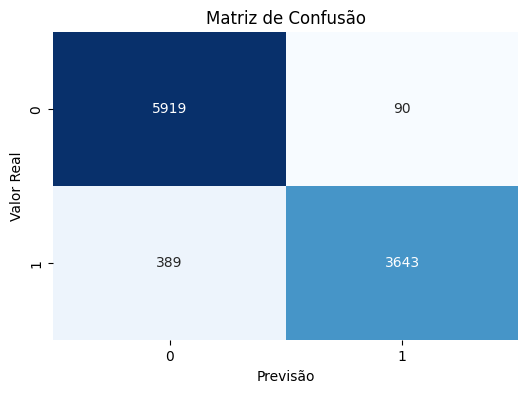

              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      6009
         1.0       0.98      0.90      0.94      4032

    accuracy                           0.95     10041
   macro avg       0.96      0.94      0.95     10041
weighted avg       0.95      0.95      0.95     10041



In [ ]:

from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_mcf_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.title("Matriz de Confusão")
plt.xlabel("Previsão")
plt.ylabel("Valor Real")
plt.show()

classification_rep = classification_report(y_test, y_mcf_pred)

print(classification_rep)

Falando sobre Churn, há duas formas de se pensar.

1) Onde preciso prever corretamente quem será churn, para pode realizar as ações necessárias.

2) Não prever de forma equivocada que um cliente será perdido, para não gastar esforços desnecessários em clientes em que eu não perderia.

Dessa maneira, o recall se torna uma métrica interessante para se analisar, uma vez que ele testa os verdadeiras positivos / verdadeiros positivos + falso negativos (Onde deveríamos ter o mínimo possivel de Falso Negativo)

Olhando pelo ponto 1), temos um recall de 0.9, que é bom, mas deixa a desejar, pois tende a deixarmos clientes virarem churn, por conta do resultado do modelo.

Olhando pelo ponto 2) temos um resultado excelente, de 0.99, o que não nos deixaria gastar esforço desnecessário, com clientes que não irão virar churn.

### Utilização de Hiperparâmetros (Bagging)

Aqui tentaremos descobrir os melhores parâmetros para o Bagging (Modelo Escolhido), a fim de ter uma melhora final na acurácia de nosso modelo.

In [ ]:
pipelineGS = []

BAGGS =  BaggingClassifier()
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelineGS.append(('BAG-orig', Pipeline(steps=[BAGGS])))
pipelineGS.append(('BAG-padr', Pipeline(steps=[standard_scaler, BAGGS])))
pipelineGS.append(('BAG-norm', Pipeline(steps=[min_max_scaler, BAGGS])))

param_grid = {
    'n_estimators': [70, 100, 130],
    'max_features': [3, 5, 7]
}


# Prepara e executa o GridSearchCV
for name, model in pipelineGS:
    grid = GridSearchCV(estimator=BAGGS, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print("%s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

BAG-orig - Melhor: 0.952171 usando {'max_features': 7, 'n_estimators': 70}
BAG-padr - Melhor: 0.952520 usando {'max_features': 7, 'n_estimators': 130}
BAG-norm - Melhor: 0.952271 usando {'max_features': 7, 'n_estimators': 100}


### Finalização do Modelo

Realização de Treinamento final do Modelo.

Por apresentar uma melhor acurácia, o modelo escolhido foi o Bagging Padronizado, com "max_features" = 7 e "n_estimators" = 70

In [ ]:
# Avaliação do modelo com o conjunto de testes

# Preparação do modelo
scaler = StandardScaler().fit(X_train) # ajuste de Padronização com o conjunto de treino
rescaledX = scaler.transform(X_train) # aplicação da Padronização no conjunto de treino
model = BaggingClassifier(base_estimator = DecisionTreeClassifier(), n_estimators=70, max_features = 7)
model.fit(rescaledX, y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX = scaler.transform(X_test) # aplicação da Padronização no conjunto de teste
predictions = model.predict(rescaledTestX)
print(accuracy_score(y_test, predictions))

0.9503037546061149


In [ ]:
# Preparação do modelo com TODO o dataset
scaler = StandardScaler().fit(x) # ajuste do scaler com TODO o dataset
rescaledX = scaler.transform(x) # aplicação da padronização com TODO o dataset
model.fit(rescaledX, y)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), max_features=7,
                  n_estimators=70)

In [ ]:
## Salvando Modelo

from joblib import dump

dump(model, 'Bagging_Padr.joblib')

print("Modelo Salvo com Sucesso!")

Modelo Salvo com Sucesso!


##2ª Parte - Deep Learning

### Definição do Problema



###### Teremos agora um novo desafio: Criar um classificador de imagens.

###### Um desenho animado muito assistido, pelo menos por mim, em minha infância, foi o Tom e Jerry.

###### Tom é um gato que mora em uma casa normal e Jerry é um rato que vive escondido nas paredes dessa casa. Tom tenta de todas as maneiras capturar Jerry, porém o pequeno rato sempre arruma um jeito de se livrar de Tom.

###### Nosso objetivo neste trabalho será identificar imagens em que Tom aparece e imagens que Jerry aparece.

###Importação de Bibliotecas

In [ ]:
!pip install gdown
import gdown
import os
import zipfile

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt

###Importação de DataSet e Transformação em DataFrame

Estamos puxando os dados diretamente do meu Google Drive, que já está público. Os dados encontram-se todos no mesmo arquivo zip e no inicio de cada arquivo, possuímos a classe (Tom e Jerry)

In [ ]:
id_arq = "1Z2xS1J8F0J5eFrbT9k1Ki6WXnCu136YK"
url = f"https://drive.google.com/uc?id={id_arq}"

folder_path = "./dataset"  # pasta em que iremos baixar o arquivo zip
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/train.zip"  # pasta em que iremos baixar o arquivo zip
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1Z2xS1J8F0J5eFrbT9k1Ki6WXnCu136YK
To: /content/dataset/train.zip
100%|██████████| 207M/207M [00:01<00:00, 169MB/s]


'dataset/train.zip'

In [ ]:
destination = 'datasets/tom_vs_jerry/working/train_images/' # path onde iremos armazenar as imagens

os.makedirs(destination,exist_ok=True) # cria a pasta de destino se necessário

with zipfile.ZipFile(output,'r') as zip_ref:
    zip_ref.extractall(destination)

Checando arquivos baixados

In [ ]:
r='datasets/tom_vs_jerry/working/train_images'
print(os.listdir(r))

['tom_frame3573.jpg', 'jerry_frame2300.jpg', 'jerry_frame2014.jpg', 'jerry_frame4830.jpg', 'tom_frame2852.jpg', 'tom_frame2952.jpg', 'tom_frame2442.jpg', 'jerry_frame3338.jpg', 'jerry_frame3864.jpg', 'jerry_frame1651.jpg', 'tom_frame3484.jpg', 'tom_frame3578.jpg', 'jerry_frame2680.jpg', 'tom_frame438.jpg', 'tom_frame437.jpg', 'tom_frame2415.jpg', 'tom_frame887.jpg', 'jerry_frame2003.jpg', 'jerry_frame2798.jpg', 'tom_frame513.jpg', 'tom_frame3558.jpg', 'tom_frame550.jpg', 'jerry_frame1623.jpg', 'tom_frame3463.jpg', 'tom_frame1364.jpg', 'tom_frame2079.jpg', 'jerry_frame1136.jpg', 'tom_frame2132.jpg', 'tom_frame1457.jpg', 'jerry_frame3098.jpg', 'jerry_frame834.jpg', 'jerry_frame3215.jpg', 'jerry_frame3104.jpg', 'tom_frame2779.jpg', 'tom_frame1916.jpg', 'jerry_frame2682.jpg', 'tom_frame814.jpg', 'tom_frame1664.jpg', 'tom_frame1652.jpg', 'tom_frame2865.jpg', 'tom_frame2158.jpg', 'jerry_frame5167.jpg', 'tom_frame2960.jpg', 'tom_frame950.jpg', 'tom_frame3340.jpg', 'tom_frame2587.jpg', 'tom_fr

In [ ]:
path='datasets/tom_vs_jerry/working/train_images/'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 2480 imagens para o treinamento e avaliação do modelo de deep learning


Criando dataframe a partir de imagens

In [ ]:
images =os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    labels.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [ ]:
df['class'] = df['class'].replace('jer', 'jerry')

In [ ]:
df.head()

,images,class,height,width,channels,filesize
0,tom_frame3573.jpg,tom,480,854,3,84912
1,jerry_frame2300.jpg,jerry,480,854,3,41869
2,jerry_frame2014.jpg,jerry,480,854,3,60831
3,jerry_frame4830.jpg,jerry,480,854,3,52378
4,tom_frame2852.jpg,tom,480,854,3,69784


Verificando balanceamento da base de dados

tom      1240
jerry    1240
Name: class, dtype: int64


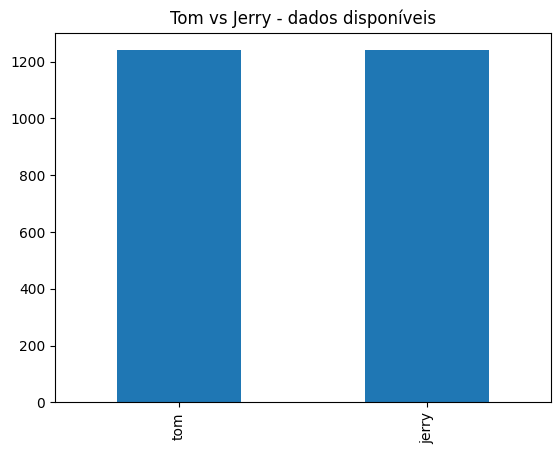

In [ ]:
print((df['class']).value_counts())
dogsVScats_count = df['class'].value_counts().plot.bar(title='Tom vs Jerry - dados disponíveis')

Os dados estão perfeitamente balanceados.

Agora vamos plotar algumas imagens.

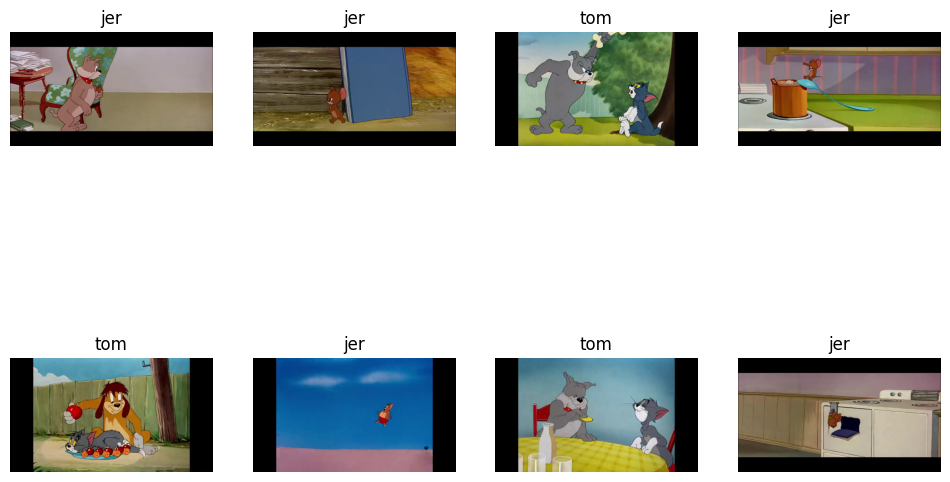

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 8 imagens
for i in range(8):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

plt.show()

### Preparação dos Dados

Separando dados em treino e teste - 25% para teste

In [ ]:
train, test = train_test_split(df[['images' , 'class']] ,test_size=0.25 ,random_state=42 , shuffle=True)

Analisando treino e teste

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                   images  class
1234  jerry_frame5435.jpg  jerry
2126  jerry_frame1327.jpg  jerry
1299  jerry_frame1311.jpg  jerry
2012     tom_frame435.jpg    tom
1123  jerry_frame1039.jpg  jerry
...                   ...    ...
1638  jerry_frame3930.jpg  jerry
1095    tom_frame1776.jpg    tom
1130     tom_frame177.jpg    tom
1294     tom_frame558.jpg    tom
860   jerry_frame4305.jpg  jerry

[1860 rows x 2 columns]
##### Test: #####
                   images  class
767   jerry_frame5114.jpg  jerry
259     tom_frame3634.jpg    tom
1068  jerry_frame2788.jpg  jerry
1769    tom_frame1797.jpg    tom
56      tom_frame1711.jpg    tom
...                   ...    ...
1546     tom_frame872.jpg    tom
834   jerry_frame3095.jpg  jerry
2036     tom_frame852.jpg    tom
230      tom_frame445.jpg    tom
1889  jerry_frame1350.jpg  jerry

[620 rows x 2 columns]


Aplicando técnica para aumentar a diversidade e quantidade de imagens para treinamento, aplicando transformações de rotação de imagem, data augmentarion, entre outras.

Aqui vamos também separar nosso conjunto de validação em 25% do dataset de treino.

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.25, #Gerando percentual de base de validação
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' # Base de Treino
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' # Base de Validação
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',) # Base de Teste

Found 1395 validated image filenames belonging to 2 classes.
Found 465 validated image filenames belonging to 2 classes.
Found 620 validated image filenames belonging to 2 classes.


Testando uma imagem, com as aplicações acima

Found 1 validated image filenames belonging to 1 classes.


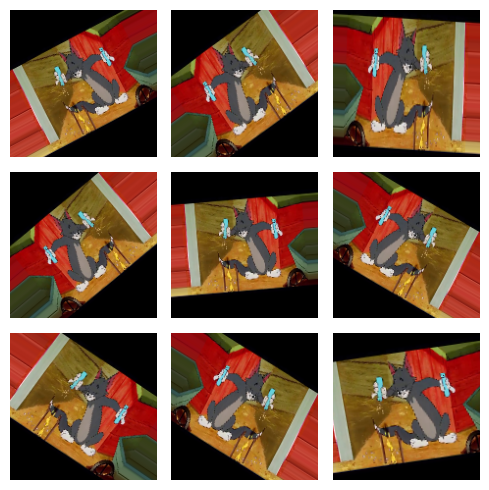

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(5, 5))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

### Configuração de Modelo

Iremos configurar um modelo de deep learning, utilizando uma rede neural convolucional (CNN) simples, com a biblioteca Keras

Ela vai possuir 32 filtros, com um tamanho de 3x3, que usa a função de ativação ReLU.

O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas max-pooling com a mesma função de ativação.

In [ ]:
## Criação do Modelo

model=models.Sequential()

## Adição de Camadas Convolucionais

model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.10))
model.add(layers.Dense(256 ,activation='relu'))
model.add(layers.Dropout(0.10))
model.add(layers.Dense( 1 , activation='sigmoid')) # Para saída binária

Exibindo resumo de nossa arquitetura de rede neural

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

### Treinamento do Modelo

Vamos realizar a compilação do modelo com as configurações de treinamento

optimizer='adam': especifica o otimizador a ser usado durante o treinamento.

loss='binary_crossentropy': especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

metrics=['accuracy']: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método fit_generator() inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento train_generator e o gerador de dados de validação val_generator.

<ipython-input-20-58389e986557>:27: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(train_generator,


Epoch 1/30
20/20 [==============================] - 31s 971ms/step - loss: 0.6967 - accuracy: 0.5172 - val_loss: 0.6910 - val_accuracy: 0.5097
Epoch 2/30
20/20 [==============================] - 15s 751ms/step - loss: 0.6747 - accuracy: 0.5578 - val_loss: 0.6685 - val_accuracy: 0.5892
Epoch 3/30
20/20 [==============================] - 19s 988ms/step - loss: 0.6447 - accuracy: 0.6364 - val_loss: 0.6387 - val_accuracy: 0.6946
Epoch 4/30
20/20 [==============================] - 15s 747ms/step - loss: 0.5739 - accuracy: 0.7203 - val_loss: 0.5784 - val_accuracy: 0.7097
Epoch 5/30
20/20 [==============================] - 14s 739ms/step - loss: 0.5046 - accuracy: 0.7547 - val_loss: 0.5406 - val_accuracy: 0.7505
Epoch 6/30
20/20 [==============================] - 14s 733ms/step - loss: 0.4196 - accuracy: 0.8166 - val_loss: 0.4460 - val_accuracy: 0.8151
Epoch 7/30
20/20 [==============================] - 14s 740ms/step - loss: 0.3565 - accuracy: 0.8562 - val_loss: 0.5553 - val_accuracy: 0.7828

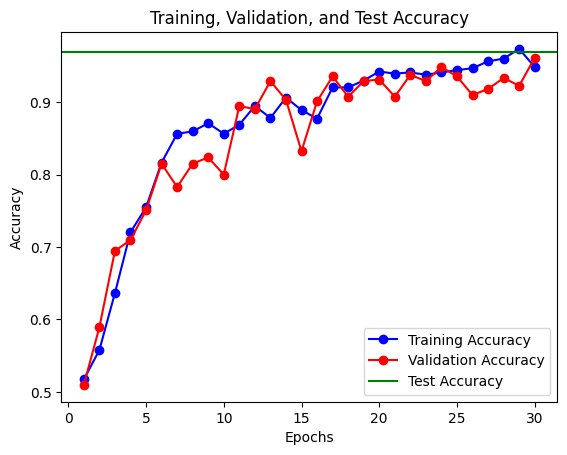

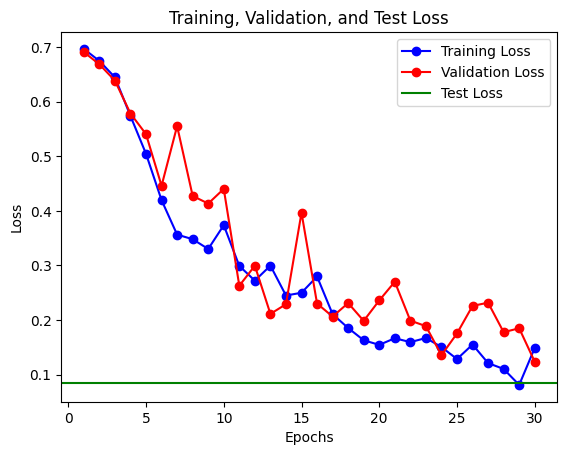

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import Callback

# Criar um callback personalizado para salvar as métricas de treinamento e validação
class MetricsCallback(Callback):
    def __init__(self):
        self.train_accuracy = []
        self.val_accuracy = []
        self.train_loss = []
        self.val_loss = []

    def on_epoch_end(self, epoch, logs=None):
        self.train_accuracy.append(logs['accuracy'])
        self.val_accuracy.append(logs['val_accuracy'])
        self.train_loss.append(logs['loss'])
        self.val_loss.append(logs['val_loss'])

# Criar uma instância do callback personalizado
metrics_callback = MetricsCallback()

# Definir número de épocas e steps por época
num_epochs = 30
steps_per_epoch = 20

# Treinar o modelo usando o callback e os parâmetros definidos
model.fit_generator(train_generator,
                    validation_data=val_generator,
                    epochs=num_epochs,
                    steps_per_epoch=steps_per_epoch,
                    callbacks=[metrics_callback])

# Avaliar o modelo no conjunto de teste
test_loss, test_accuracy = model.evaluate(test_generator)

# Obter as métricas do callback personalizado
train_accuracy = metrics_callback.train_accuracy
val_accuracy = metrics_callback.val_accuracy
train_loss = metrics_callback.train_loss
val_loss = metrics_callback.val_loss

# Criar um array com o número de épocas
epochs = range(1, len(train_accuracy) + 1)

# Plotar a acurácia
plt.plot(epochs, train_accuracy, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
plt.axhline(test_accuracy, color='g', linestyle='-', label='Test Accuracy')
plt.title('Training, Validation, and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotar a perda
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.axhline(test_loss, color='g', linestyle='-', label='Test Loss')
plt.title('Training, Validation, and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Podemos ver que o modelo vem melhorando sua acurácia de 0.5% para 0.95% ao longos dos treinamentos, o que é um resultado muito bom.

Sua perda cai de 0.7 para 0.15, um ótimo indicador também.

Treinando o modelo com mais épocas e otimizando alguns parâmetros, muito provavelmente teremos alguns indicadores melhores ainda.

### Testando o Modelo Treinado

1/1 [==============================] - 0s 130ms/step


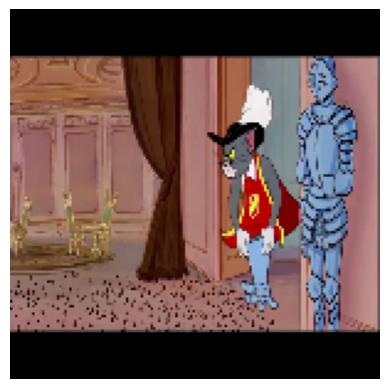

Label:  tom
Previsão:  tom
Probabilidade:  0.98389786


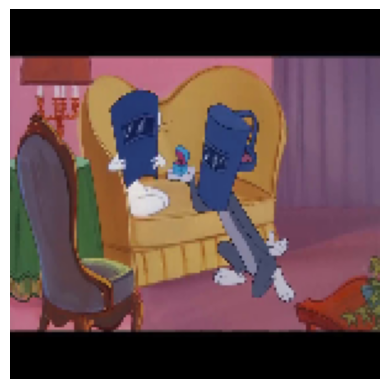

Label:  tom
Previsão:  tom
Probabilidade:  0.9996922


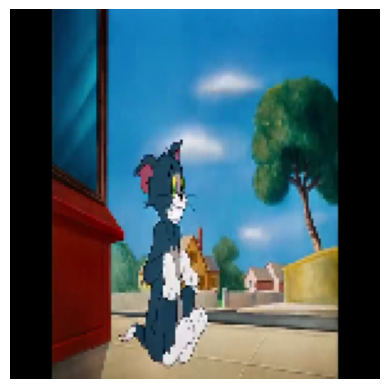

Label:  tom
Previsão:  tom
Probabilidade:  0.97748405


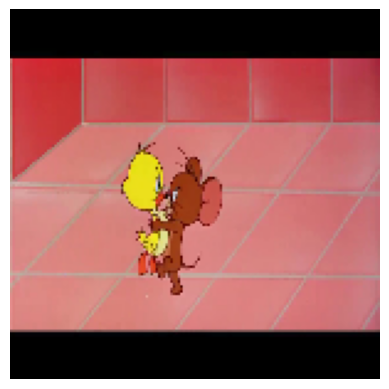

Label:  jerry
Previsão:  jerry
Probabilidade:  0.10050182


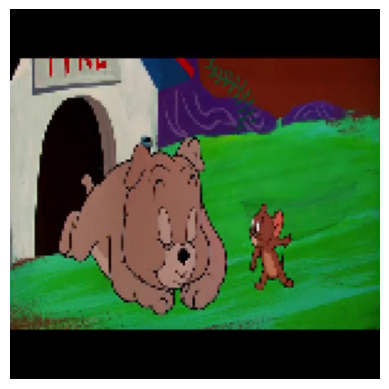

Label:  jerry
Previsão:  jerry
Probabilidade:  0.010912633


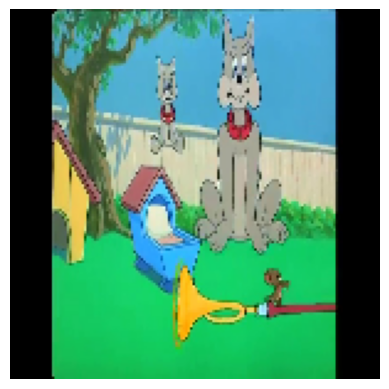

Label:  jerry
Previsão:  jerry
Probabilidade:  0.022640983


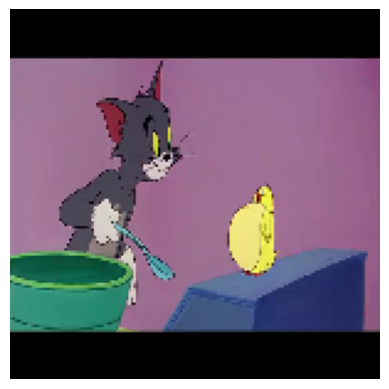

Label:  tom
Previsão:  tom
Probabilidade:  0.99902153


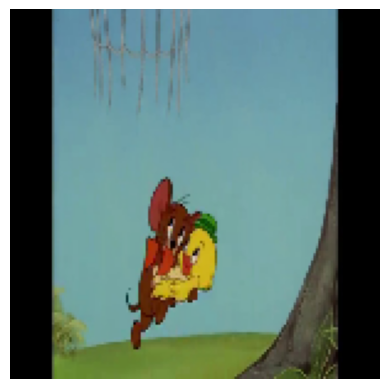

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0015472207


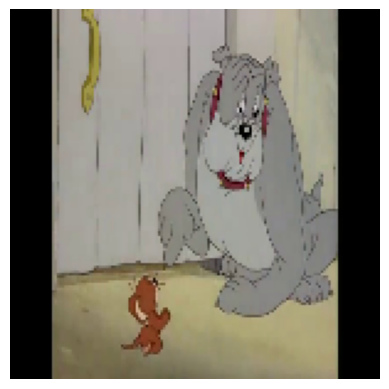

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0399918


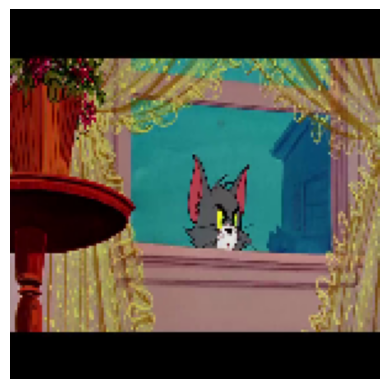

Label:  tom
Previsão:  tom
Probabilidade:  0.91708124


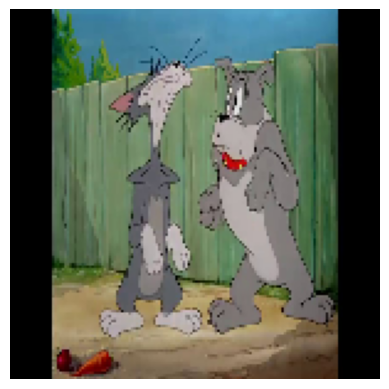

Label:  tom
Previsão:  tom
Probabilidade:  0.93846834


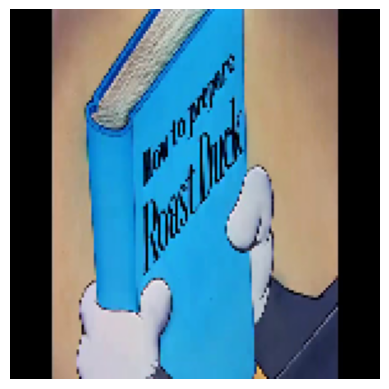

Label:  tom
Previsão:  jerry
Probabilidade:  0.3744265


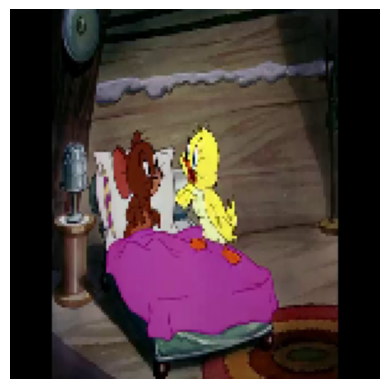

Label:  jerry
Previsão:  jerry
Probabilidade:  0.050056145


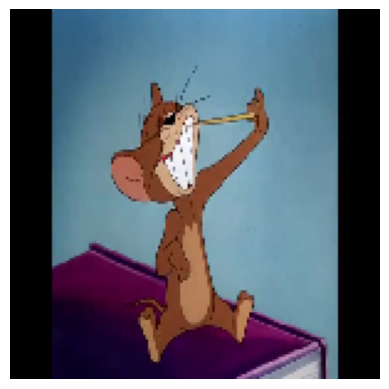

Label:  jerry
Previsão:  jerry
Probabilidade:  0.016563784


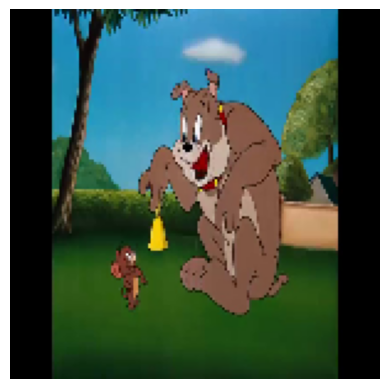

Label:  jerry
Previsão:  jerry
Probabilidade:  0.16185227


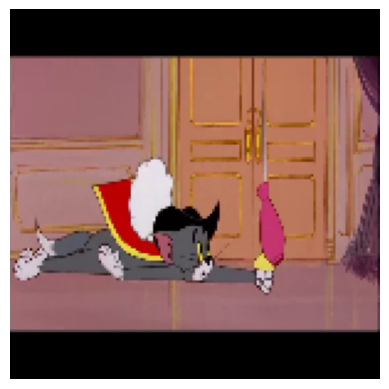

Label:  tom
Previsão:  tom
Probabilidade:  0.9999261


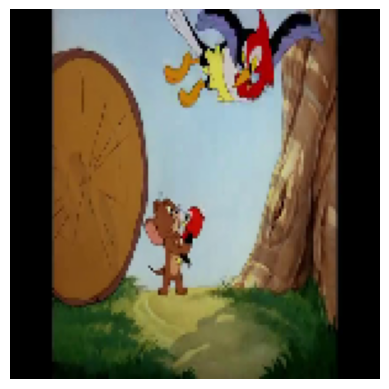

Label:  jerry
Previsão:  jerry
Probabilidade:  0.002222327


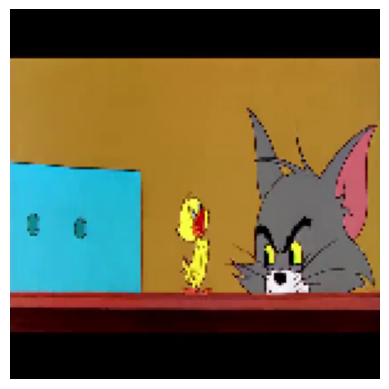

Label:  tom
Previsão:  tom
Probabilidade:  0.99967


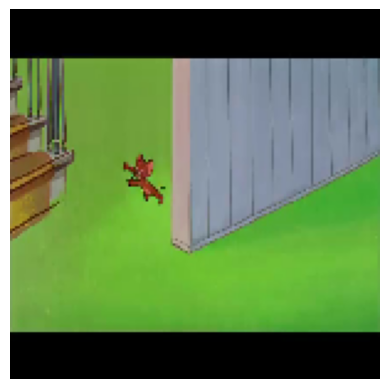

Label:  jerry
Previsão:  jerry
Probabilidade:  0.13340893


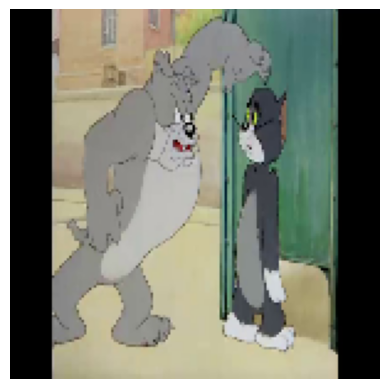

Label:  tom
Previsão:  tom
Probabilidade:  0.9920021


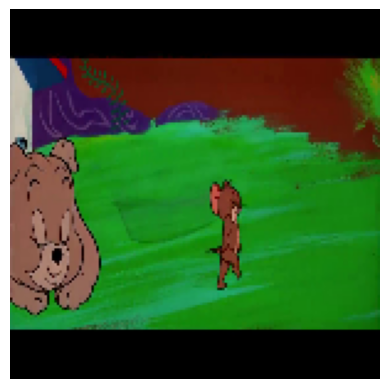

Label:  jerry
Previsão:  jerry
Probabilidade:  0.014893549


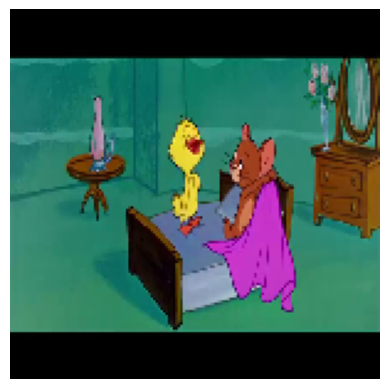

Label:  jerry
Previsão:  jerry
Probabilidade:  0.00035975737


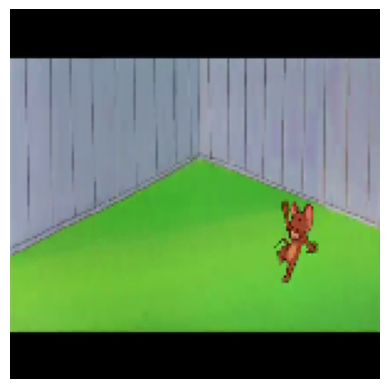

Label:  jerry
Previsão:  jerry
Probabilidade:  0.021169595


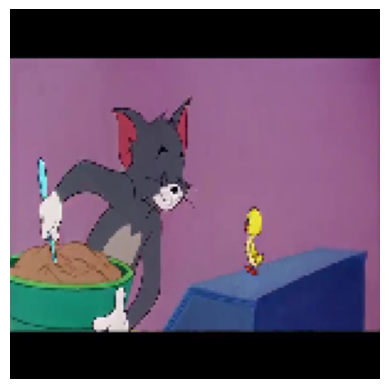

Label:  tom
Previsão:  tom
Probabilidade:  0.9999572


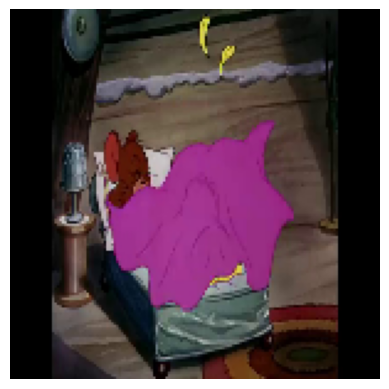

Label:  jerry
Previsão:  jerry
Probabilidade:  0.019834073


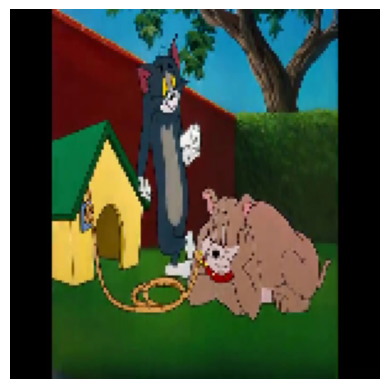

Label:  tom
Previsão:  tom
Probabilidade:  0.99966943


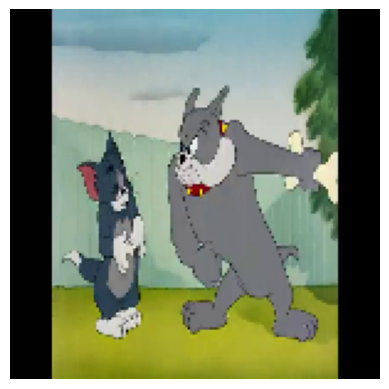

Label:  tom
Previsão:  tom
Probabilidade:  0.9995073


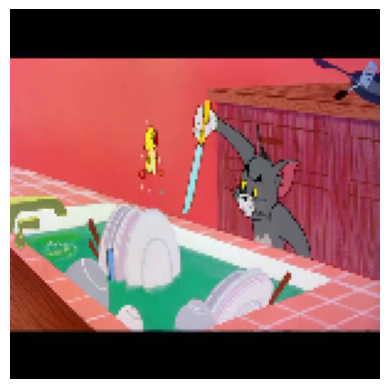

Label:  tom
Previsão:  tom
Probabilidade:  0.9954222


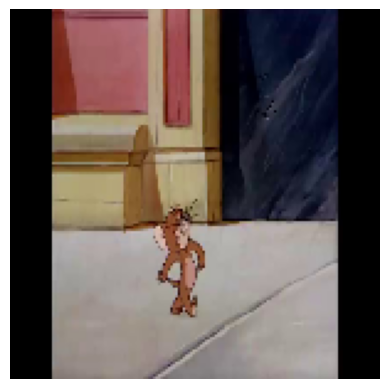

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0060303174


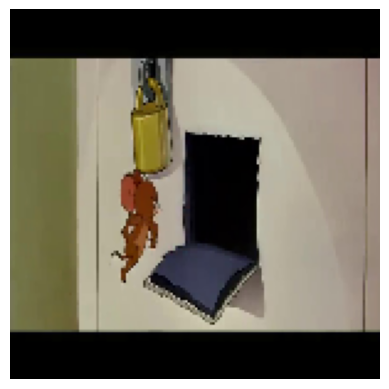

Label:  jerry
Previsão:  jerry
Probabilidade:  0.007397011


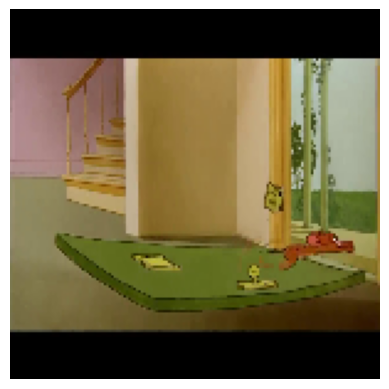

Label:  jerry
Previsão:  jerry
Probabilidade:  0.35474956


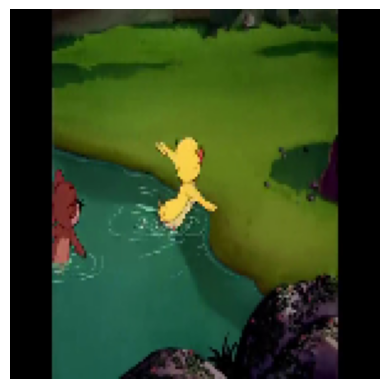

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0012230899
1/1 [==============================] - 0s 36ms/step


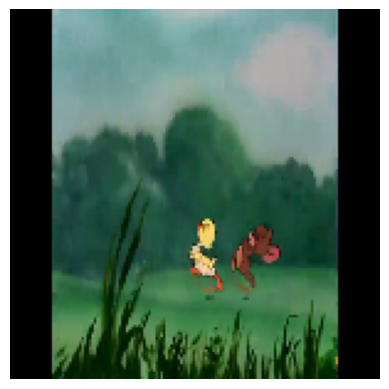

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0043025673


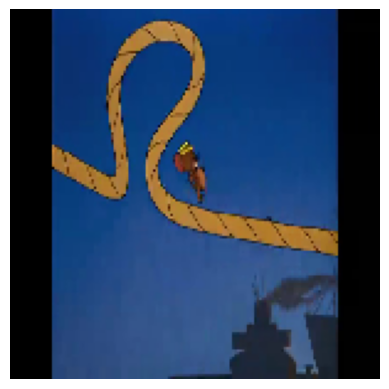

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0011835892


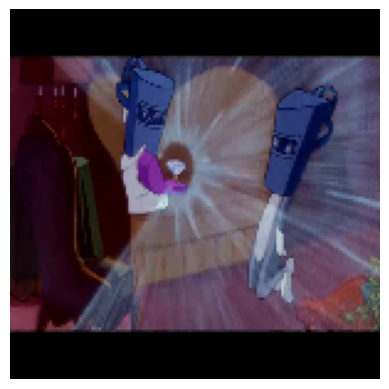

Label:  tom
Previsão:  tom
Probabilidade:  0.9967719


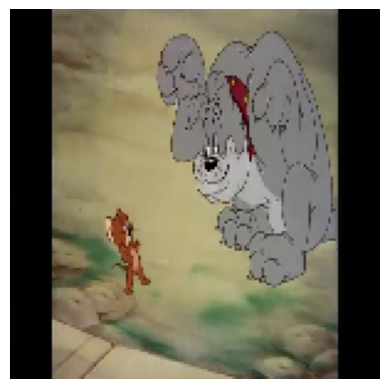

Label:  jerry
Previsão:  jerry
Probabilidade:  0.003980426


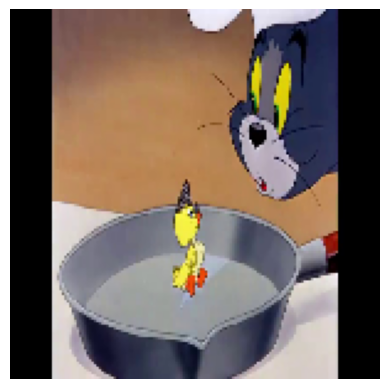

Label:  tom
Previsão:  tom
Probabilidade:  0.87566847


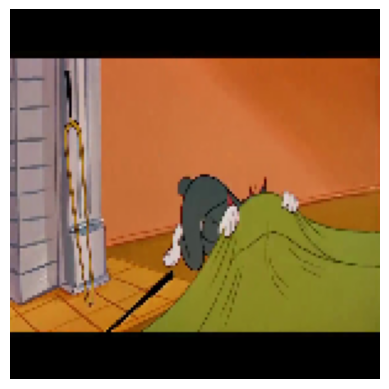

Label:  tom
Previsão:  tom
Probabilidade:  0.9955615


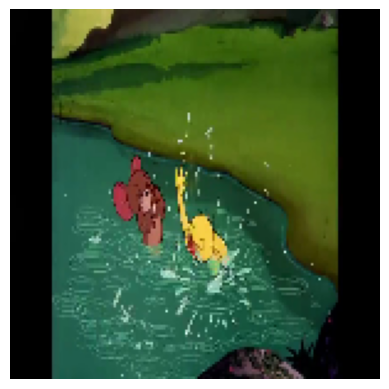

Label:  jerry
Previsão:  jerry
Probabilidade:  9.669155e-05


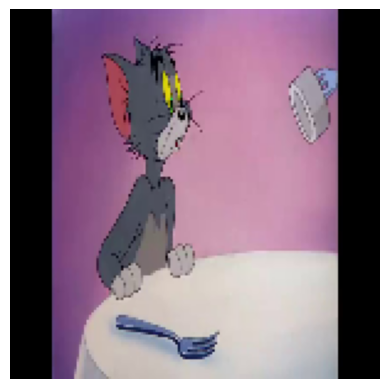

Label:  tom
Previsão:  tom
Probabilidade:  0.96136034


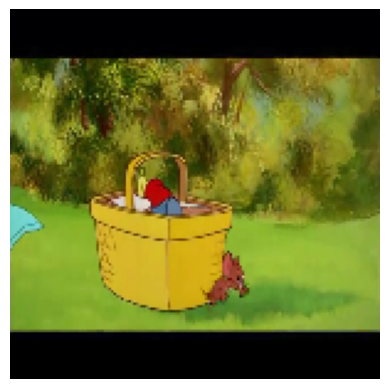

Label:  jerry
Previsão:  jerry
Probabilidade:  0.18250512


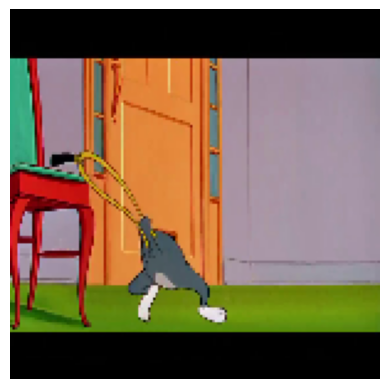

Label:  tom
Previsão:  tom
Probabilidade:  0.99907887


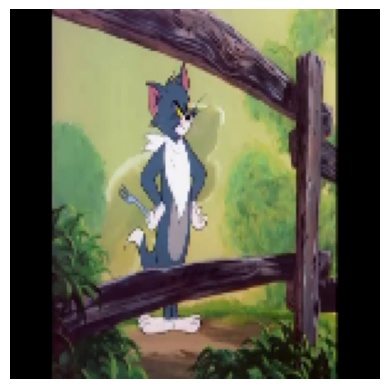

Label:  tom
Previsão:  tom
Probabilidade:  0.99558216


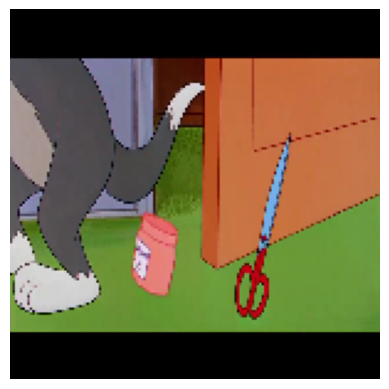

Label:  tom
Previsão:  tom
Probabilidade:  0.99058914


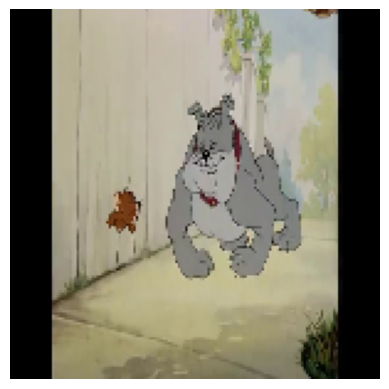

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0030891015


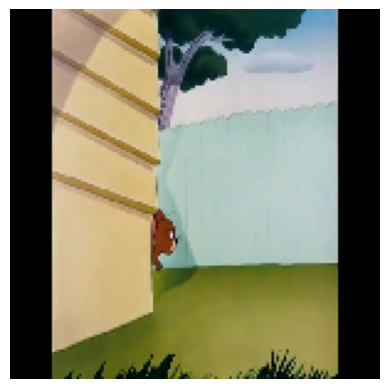

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0019160196


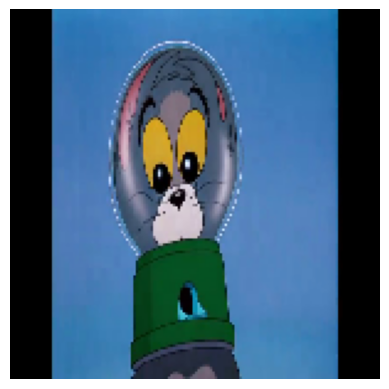

Label:  tom
Previsão:  tom
Probabilidade:  0.9876209


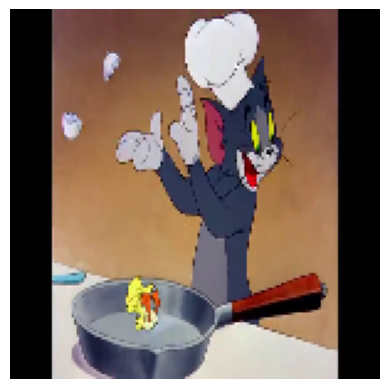

Label:  tom
Previsão:  tom
Probabilidade:  0.9866715


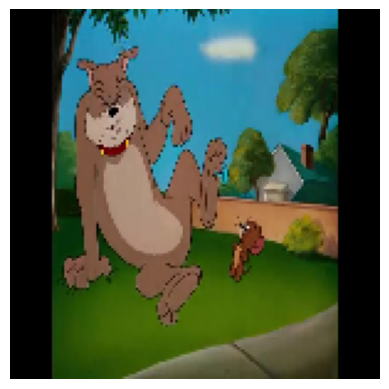

Label:  jerry
Previsão:  jerry
Probabilidade:  0.003973196


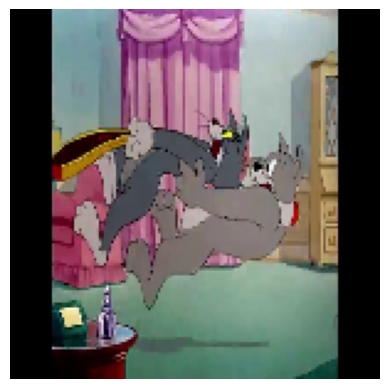

Label:  tom
Previsão:  tom
Probabilidade:  0.9752312


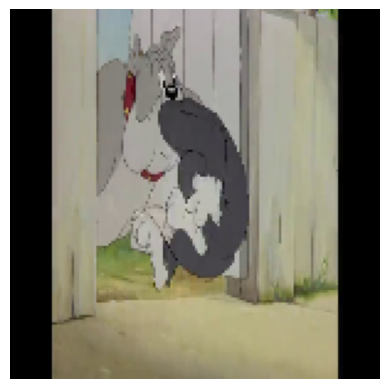

Label:  tom
Previsão:  tom
Probabilidade:  0.99900985


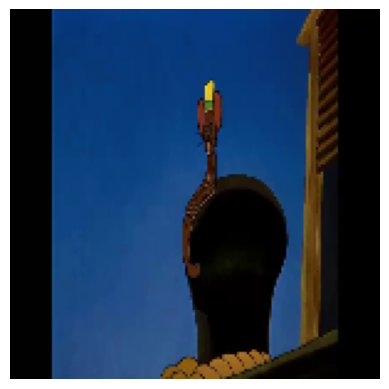

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0026709565


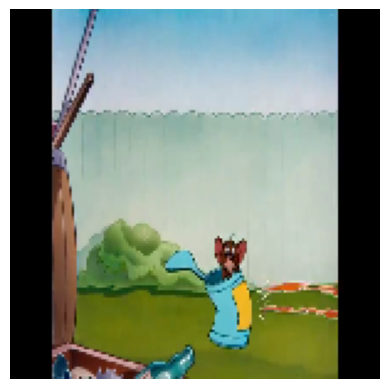

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0042529106


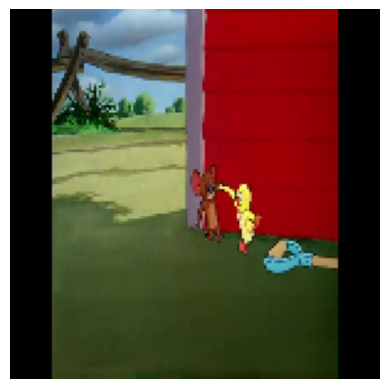

Label:  jerry
Previsão:  jerry
Probabilidade:  0.025369218


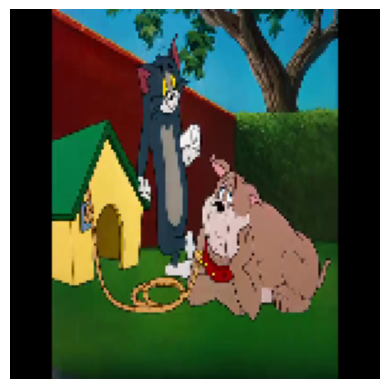

Label:  tom
Previsão:  tom
Probabilidade:  0.9998387


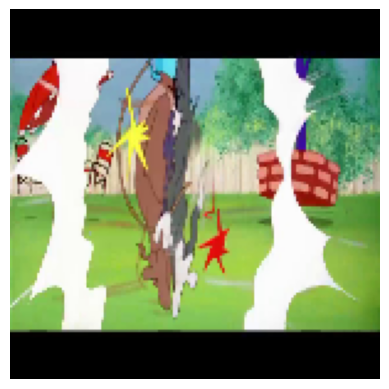

Label:  tom
Previsão:  tom
Probabilidade:  0.99885714


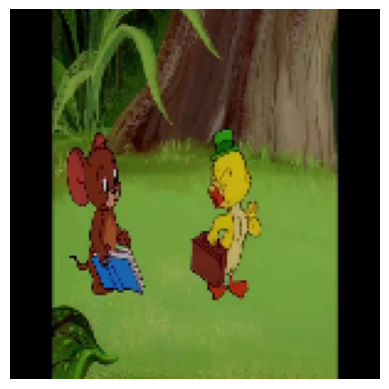

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0009804552


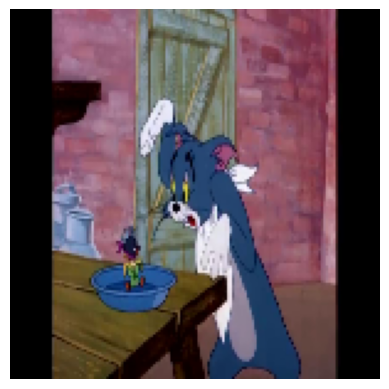

Label:  tom
Previsão:  tom
Probabilidade:  0.9994004


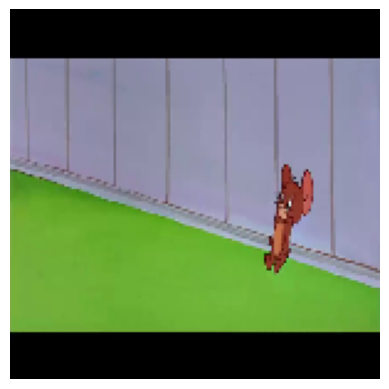

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0031244804


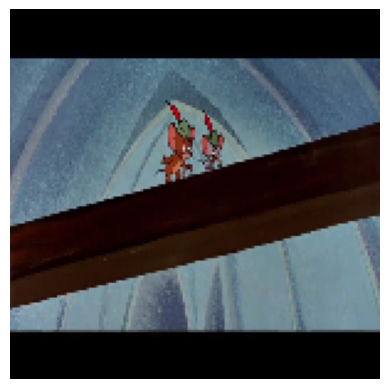

Label:  jerry
Previsão:  jerry
Probabilidade:  0.1000177


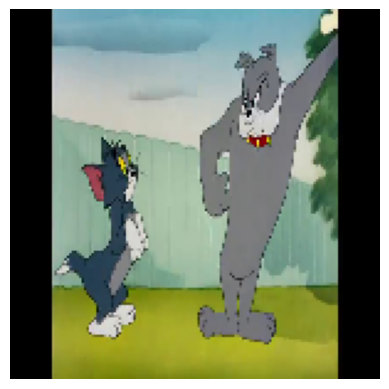

Label:  tom
Previsão:  tom
Probabilidade:  0.98926777


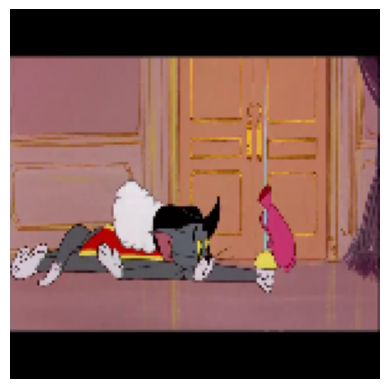

Label:  tom
Previsão:  tom
Probabilidade:  0.99957365


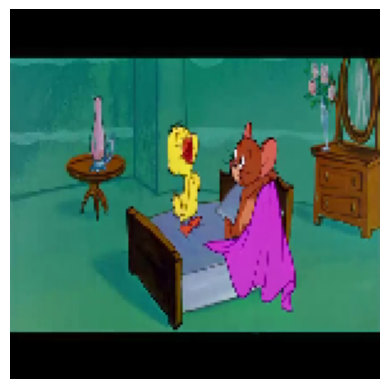

Label:  jerry
Previsão:  jerry
Probabilidade:  0.00021967065


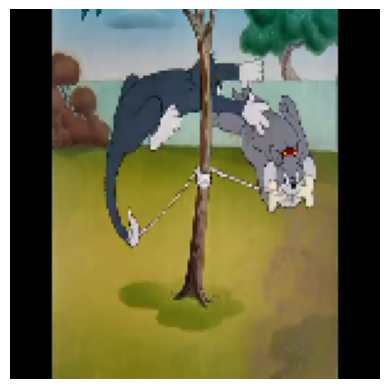

Label:  tom
Previsão:  tom
Probabilidade:  0.9928786


In [21]:
count = 0
y_pred = list()
y_true = list()
class_names = ['jerry', 'tom']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'tom' if prediction >= 0.5 else 'jerry' ## Quando mais próximo de 0, melhor prevê Jerry e quando mais próximo de 1, melhor prevê Tom
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

### Avaliação do Modelo

Criação de função para gerar matriz de confusão

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

Verificando Acurácia e Loss nos dados de Teste

In [23]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-23-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.969355  ;  loss = 0.084536 


Verificando outras métricas

In [24]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.984375
Precision:  0.9848345588235294
Recall:  0.984375
F1 Score:  0.9843635307071201


Verificando resultado a partir de uma matriz de confusão

Matriz de confusão sem normalização
              precision    recall  f1-score   support

       jerry       0.97      1.00      0.99        33
         tom       1.00      0.97      0.98        31

    accuracy                           0.98        64
   macro avg       0.99      0.98      0.98        64
weighted avg       0.98      0.98      0.98        64



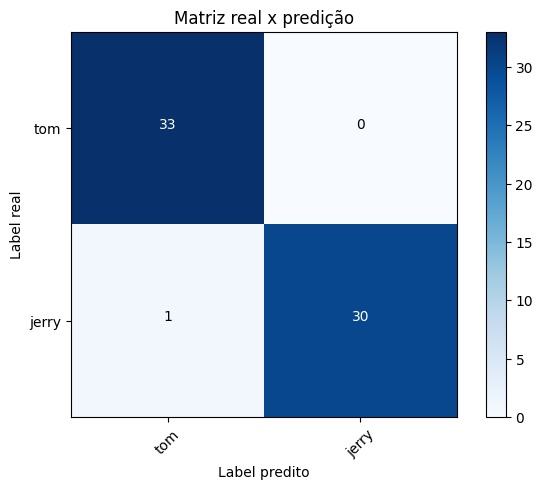

In [25]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['tom',
                               'jerry'],
                      normalize= False,
                      title='Matriz real x predição')

classification_rep = classification_report(y_true, y_pred)

print(classification_rep)

Podemos analisar pelo resultado da Matriz de confusão que o modelo está bem assertivo. Ele está errando um pouco a mais para Tom do que para Jerry, mas uma diferença muito pequena.

### Exportação do Modelo

salvando modelo treinado para utilizações futuras

In [26]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/tom_vs_jerry/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-20T0317.h5


### Testando Modelo Exportado

Carregando modelo salvo

In [27]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-20T0317.h5 carregado com sucesso


Testando modelo carregado

1/1 [==============================] - 0s 24ms/step


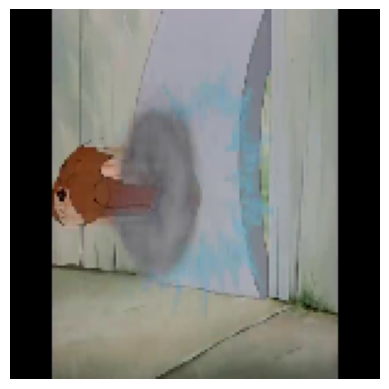

Label:  jerry
Previsão:  jerry
Probabilidade:  0.02318264


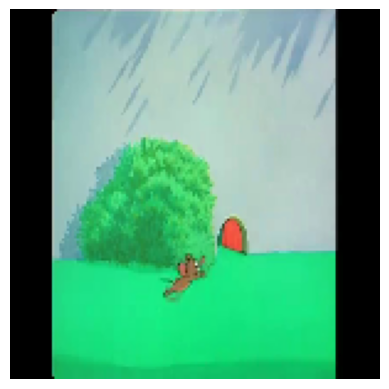

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0012929197


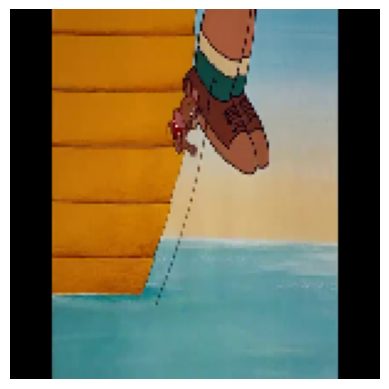

Label:  jerry
Previsão:  jerry
Probabilidade:  0.007161296


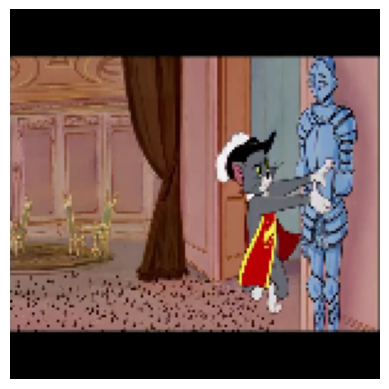

Label:  tom
Previsão:  tom
Probabilidade:  0.9972038


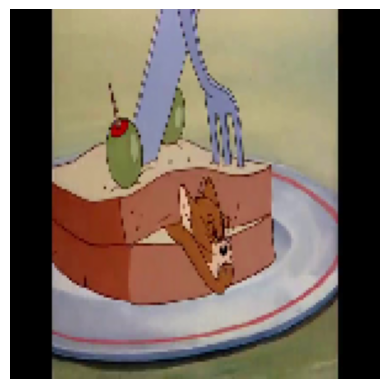

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0008498098


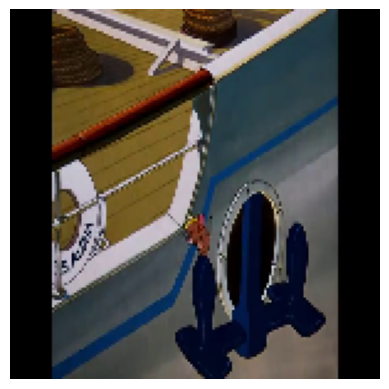

Label:  jerry
Previsão:  jerry
Probabilidade:  0.025897523


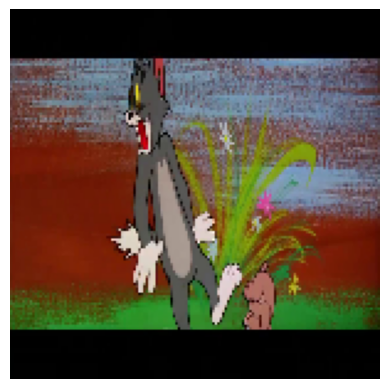

Label:  tom
Previsão:  tom
Probabilidade:  0.9991671


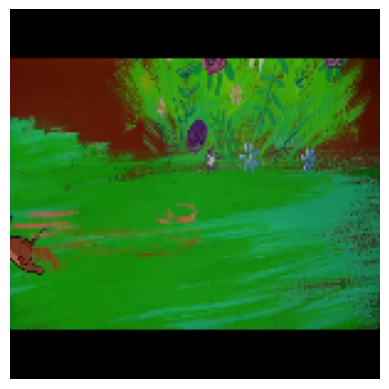

Label:  jerry
Previsão:  jerry
Probabilidade:  0.39415815


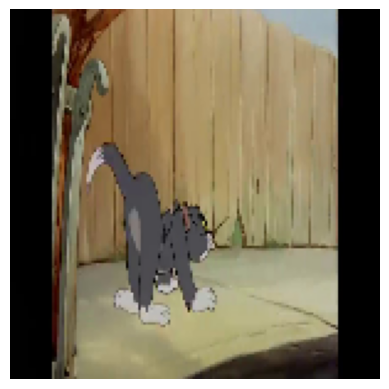

Label:  tom
Previsão:  tom
Probabilidade:  0.98512995


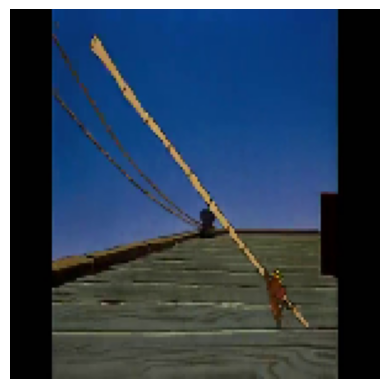

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0019283886


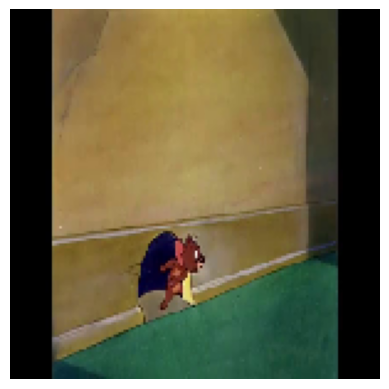

Label:  jerry
Previsão:  jerry
Probabilidade:  0.001059084


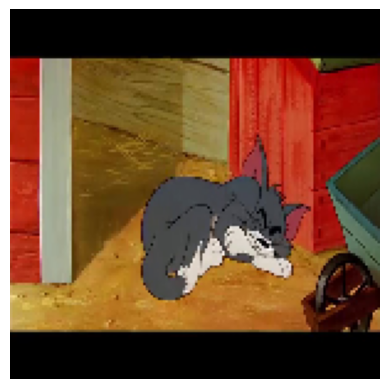

Label:  tom
Previsão:  tom
Probabilidade:  0.99918145


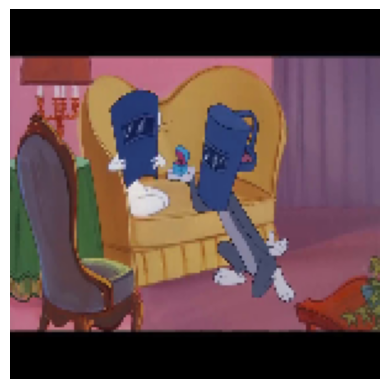

Label:  tom
Previsão:  tom
Probabilidade:  0.9996922


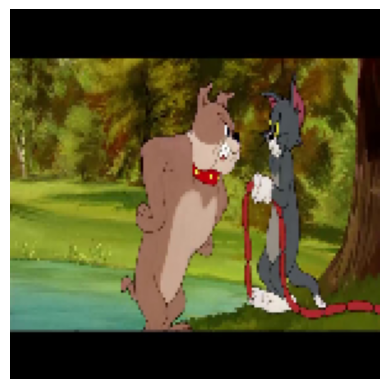

Label:  tom
Previsão:  tom
Probabilidade:  0.9991999


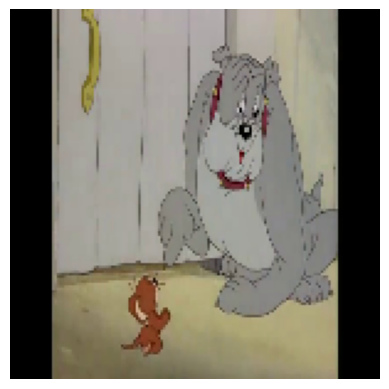

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0399918


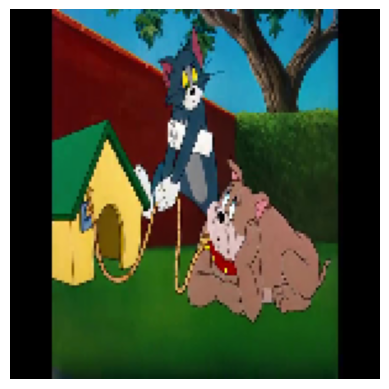

Label:  tom
Previsão:  tom
Probabilidade:  0.99992025


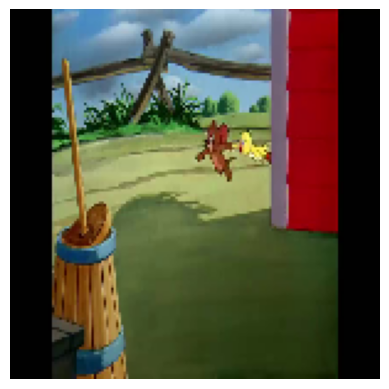

Label:  jerry
Previsão:  jerry
Probabilidade:  0.022314787


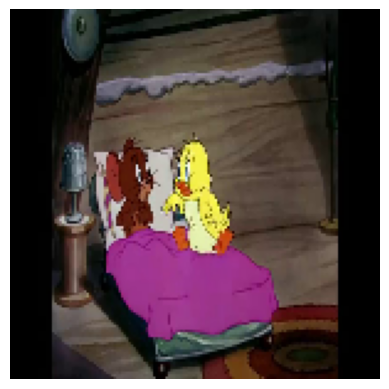

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0122115305


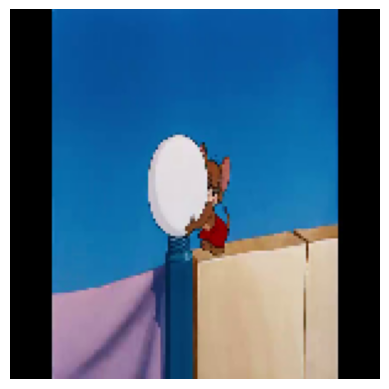

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0006479044


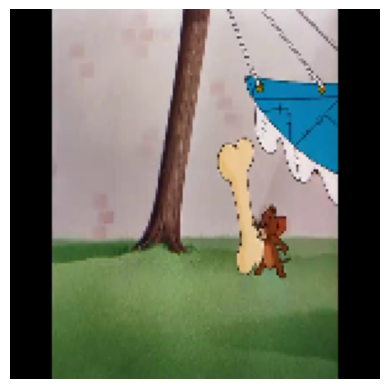

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0015147749


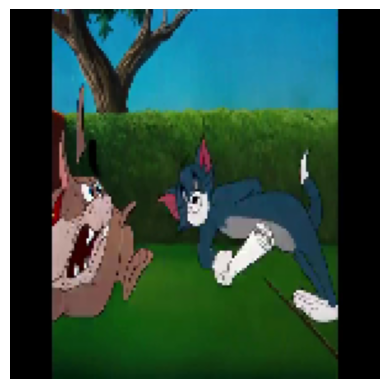

Label:  tom
Previsão:  tom
Probabilidade:  0.9999869


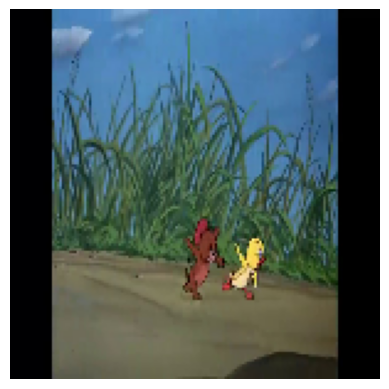

Label:  jerry
Previsão:  jerry
Probabilidade:  0.0085965805


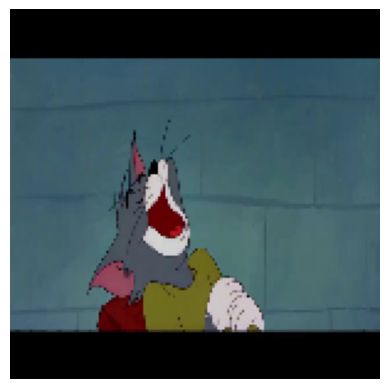

Label:  tom
Previsão:  tom
Probabilidade:  0.9990783


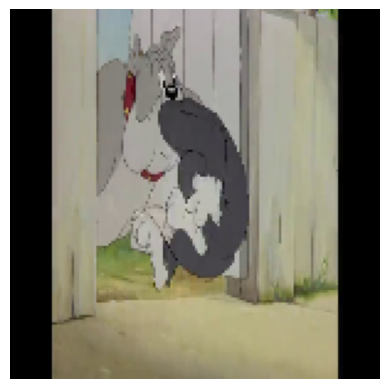

Label:  tom
Previsão:  tom
Probabilidade:  0.99900985


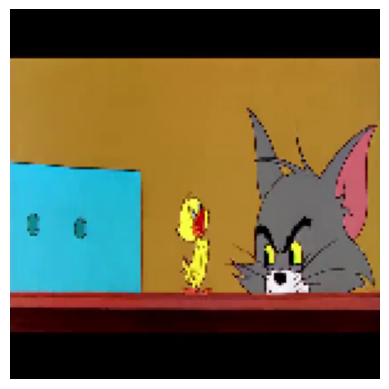

Label:  tom
Previsão:  tom
Probabilidade:  0.99967


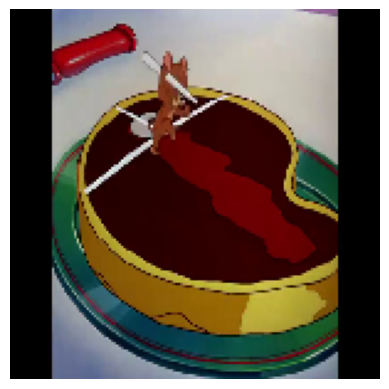

Label:  jerry
Previsão:  jerry
Probabilidade:  0.008353728


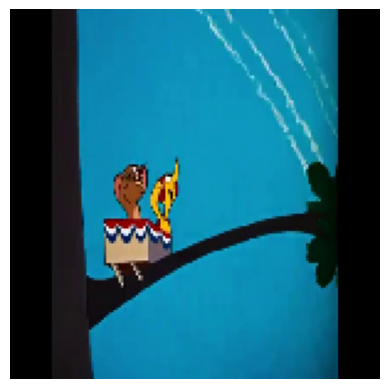

Label:  jerry
Previsão:  jerry
Probabilidade:  0.00015803534


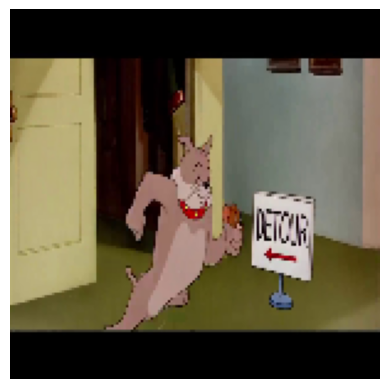

Label:  jerry
Previsão:  tom
Probabilidade:  0.6622239


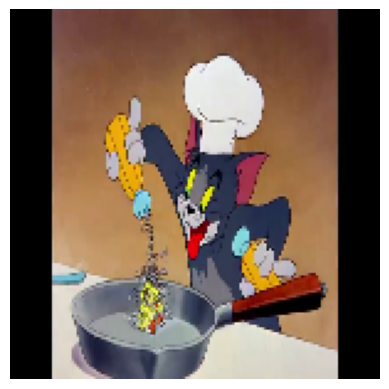

Label:  tom
Previsão:  tom
Probabilidade:  0.99990356


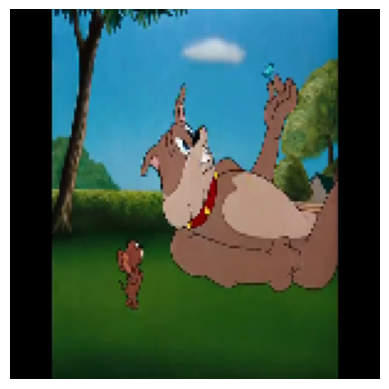

Label:  jerry
Previsão:  jerry
Probabilidade:  0.008092681


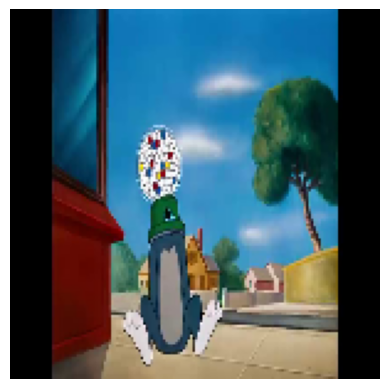

Label:  tom
Previsão:  tom
Probabilidade:  0.7672421


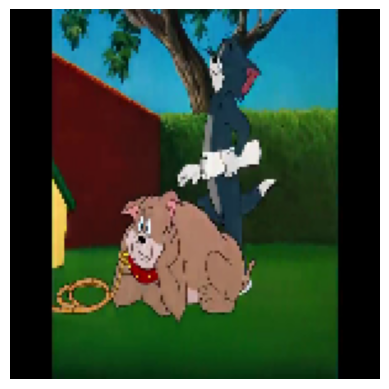

Label:  tom
Previsão:  tom
Probabilidade:  0.99109346


In [28]:
count = 0
y_pred_2 = list()
y_true_2 = list()
class_names = ['jerry', 'tom']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true_2.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'tom' if prediction >= 0.5 else 'jerry' ## Quando mais próximo de 0, melhor prevê Jerry e quando mais próximo de 1, melhor prevê Tom
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

### Conclusão

Podemos notar que o modelo ficou bem estável, com ótima Precision, Recall, F1 Score e Acurácia.

Analisando a saída do modelo, ele vem sendo muito assertivo e acaba errando em imagens em que aparecem outros personagens juntamente aos que queremos prever.

Dito isto, poderia ser desenvolvido um modelo de visão computacional para tentar "esconder" esses personagens, com a finalidade de que eles não atrapalhem o modelo esperado, de prever Tom e Jerry.